In [1]:
# Imports
# !pip install torchinfo
import torch
import torch.nn as nn
import torch.utils.data as Data
from torchvision import datasets, transforms
from torchinfo import summary
import matplotlib.pyplot as plt
import numpy as np
import random
import os
import time
import TrainerTS as TP

## Network structures

In [3]:
m1 = mymodel.ImageEncoder()
summary(m1, input_size=(1, 1, 128, 128))

Layer (type:depth-idx)                   Output Shape              Param #
ImageEncoder                             [1, 256]                  --
├─Sequential: 1-1                        [1, 16, 64, 64]           --
│    └─Conv2d: 2-1                       [1, 16, 128, 128]         160
│    └─LeakyReLU: 2-2                    [1, 16, 128, 128]         --
│    └─MaxPool2d: 2-3                    [1, 16, 64, 64]           --
├─Sequential: 1-2                        [1, 32, 32, 32]           --
│    └─Conv2d: 2-4                       [1, 32, 64, 64]           4,640
│    └─LeakyReLU: 2-5                    [1, 32, 64, 64]           --
│    └─MaxPool2d: 2-6                    [1, 32, 32, 32]           --
├─Sequential: 1-3                        [1, 64, 16, 16]           --
│    └─Conv2d: 2-7                       [1, 64, 32, 32]           18,496
│    └─LeakyReLU: 2-8                    [1, 64, 32, 32]           --
│    └─MaxPool2d: 2-9                    [1, 64, 16, 16]           --
├─Seque

In [4]:
m2 = mymodel.ImageDecoder()
summary(m2, input_size=(1, 256))

Layer (type:depth-idx)                   Output Shape              Param #
ImageDecoder                             [1, 1, 128, 128]          --
├─Sequential: 1-1                        [1, 256]                  --
│    └─Linear: 2-1                       [1, 4096]                 1,052,672
│    └─ReLU: 2-2                         [1, 4096]                 --
│    └─Linear: 2-3                       [1, 256]                  1,048,832
│    └─ReLU: 2-4                         [1, 256]                  --
├─Sequential: 1-2                        [1, 64, 32, 32]           --
│    └─ConvTranspose2d: 2-5              [1, 64, 32, 32]           1,088
│    └─LeakyReLU: 2-6                    [1, 64, 32, 32]           --
├─Sequential: 1-3                        [1, 32, 64, 64]           --
│    └─ConvTranspose2d: 2-7              [1, 32, 64, 64]           32,800
│    └─LeakyReLU: 2-8                    [1, 32, 64, 64]           --
├─Sequential: 1-4                        [1, 1, 128, 128]       

In [5]:
m3 = mymodel.CsiEncoder()
summary(m3, input_size=(2, 90, 100))

Layer (type:depth-idx)                   Output Shape              Param #
CsiEncoder                               [1, 256]                  353,374,464
├─Sequential: 1-1                        [1, 16, 30, 98]           --
│    └─Conv2d: 2-1                       [1, 16, 30, 98]           160
│    └─LeakyReLU: 2-2                    [1, 16, 30, 98]           --
├─Sequential: 1-2                        [1, 32, 14, 48]           --
│    └─Conv2d: 2-3                       [1, 32, 14, 48]           4,640
│    └─LeakyReLU: 2-4                    [1, 32, 14, 48]           --
├─Sequential: 1-3                        [1, 64, 12, 46]           --
│    └─Conv2d: 2-5                       [1, 64, 12, 46]           18,496
│    └─LeakyReLU: 2-6                    [1, 64, 12, 46]           --
├─Sequential: 1-4                        [1, 128, 10, 44]          --
│    └─Conv2d: 2-7                       [1, 128, 10, 44]          73,856
│    └─LeakyReLU: 2-8                    [1, 128, 10, 44]       

## Loader

In [2]:
datadir = '../Dataset/0307make07/'
print(os.listdir(datadir))

['csi.npy', 'img.npy', '.ipynb_checkpoints', 'csi-wi2vi.npy']


In [3]:
transform = transforms.ToTensor()
# Specify x and y
mydata = TP.MyDataset(datadir + 'csi.npy',
                      datadir + 'img.npy',
                      (128, 128),
                      #transform,
                      img='y')
print(mydata.data['x'].shape, mydata.data['y'].shape)

train_size = int(len(mydata) * 0.8)
valid_size = int(len(mydata) * 0.1)
test_size = int(len(mydata)) - train_size - valid_size
print(train_size, valid_size, test_size)

train_loader, valid_loader, test_loader = TP.split_loader(mydata, train_size, valid_size, test_size, 64)

loaded
(7638, 2, 90, 100) (7638, 1, 128, 128)
6110 763 765
6110 763 765


In [4]:
# Hyperparameters
t_args = TP.MyArgs(cuda=0, epochs=10, learning_rate=1e-4, criterion=nn.BCELoss(reduction="sum"))
s_args = TP.MyArgs(cuda=0, epochs=10, learning_rate=1e-4, criterion=nn.MSELoss(reduction='sum'))

In [5]:
# Model and Loss
imgencoder = TP.ImageEncoderV03b4(batchnorm=False, latent_dim=16, active_func=nn.Identity()).to(t_args.device)
imgdecoder = TP.ImageDecoderV03b4(batchnorm=False, latent_dim=16).to(t_args.device)
csiencoder = TP.CsiEncoder(batchnorm=False, latent_dim=16 , bottleneck='last_fc').to(s_args.device)

trainer = TP.TrainerTeacherStudent(img_encoder=imgencoder, img_decoder=imgdecoder, csi_encoder=csiencoder,
                            teacher_args=t_args, student_args=s_args, 
                            train_loader=train_loader, valid_loader=valid_loader, test_loader=test_loader,
                            temperature=1, latent_dim=16)

In [ ]:
# Load from checkpoints
trainer.toal_epochs=0
imgencoder.load_state_dict(torch.load('../Models/ImgEn_Model_v02a1_ImgEn_Fc_0307_tep1200.pth'))
imgdecoder.load_state_dict(torch.load('../Models/ImgDe_Model_v02a1_ImgDe_FC_0307_tep1200.pth'))
csiencoder.load_state_dict(torch.load('../Models/CSIEn_Model_v02a1_CsiEn_Last_0307_tep1200_sep700.pth'))

In [8]:
# When changing learning rate
t_args = TP.MyArgs(cuda=0, epochs=10, learning_rate=1e-3, criterion=nn.BCELoss(reduction="sum"))
s_args = TP.MyArgs(cuda=0, epochs=10, learning_rate=1e-3, criterion=nn.MSELoss(reduction='sum'))
trainer.args['t'] = t_args
trainer.args['s'] = s_args

Teacher: epoch=9/10, batch=76/95,loss=63683.71875255
Total training time: 116.728675365448 sec
Teacher: test=76/95, loss=549.0888061523438
Test finished. Average loss={'LOSS': 921.4902236398898}


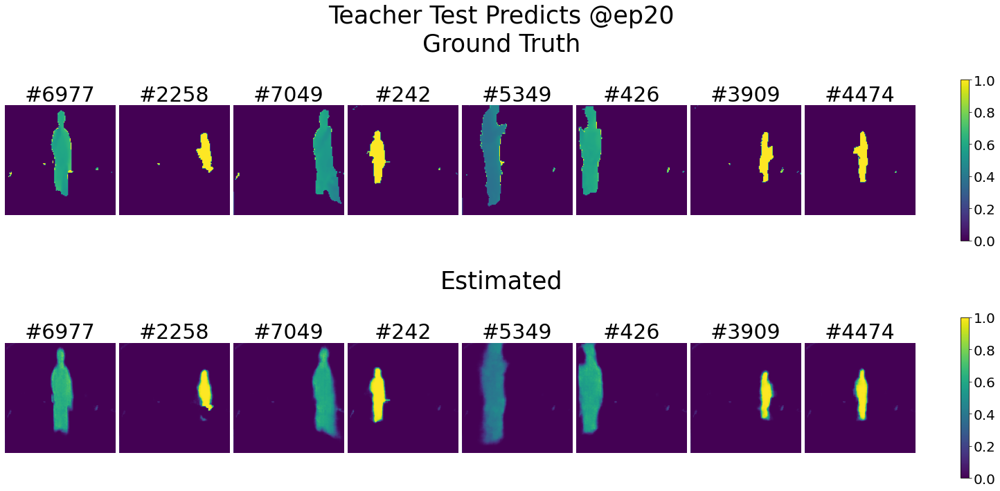

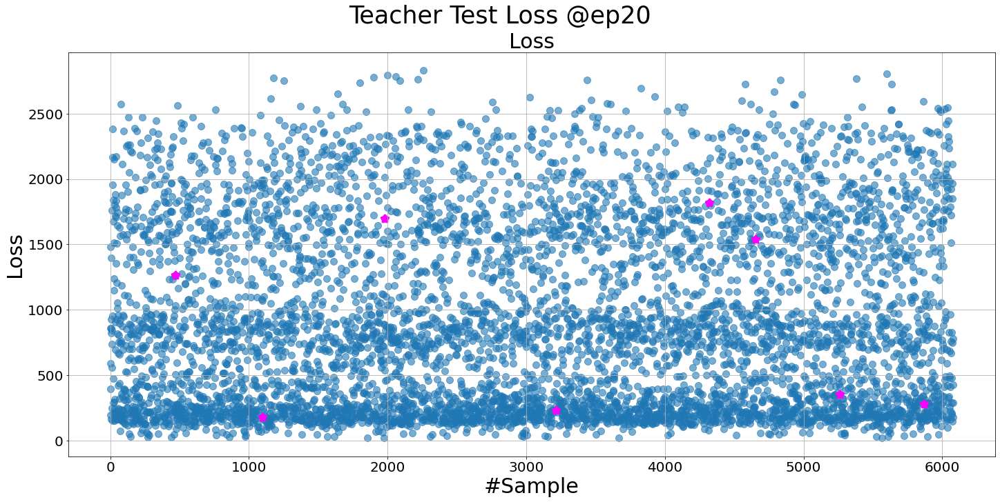

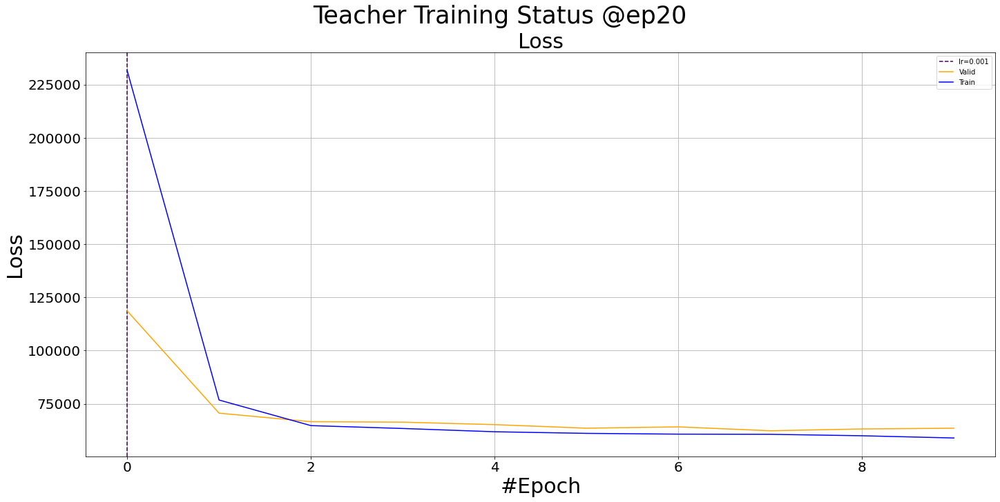

Teacher: epoch=9/10, batch=76/95,loss=55340.20312555
Total training time: 119.67178583145142 sec
Teacher: test=76/95, loss=463.48260498046875
Test finished. Average loss={'LOSS': 883.5216147334952}


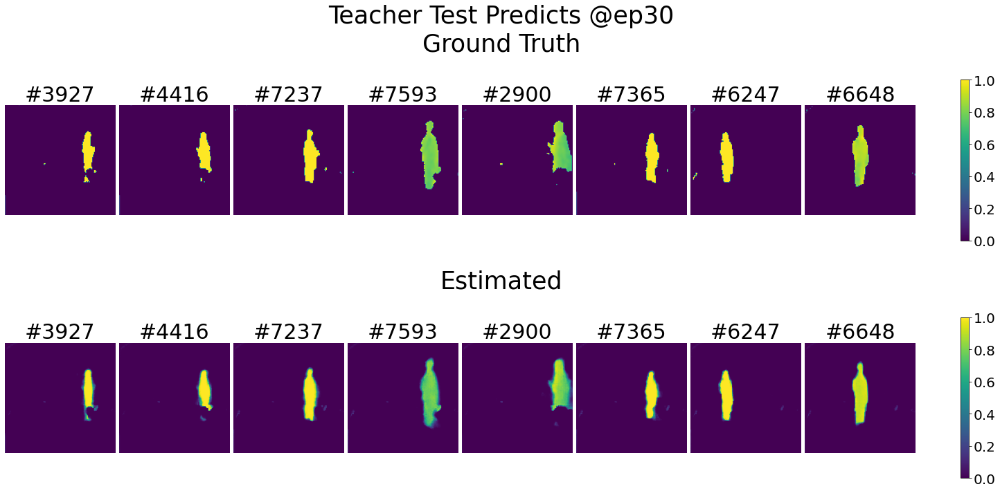

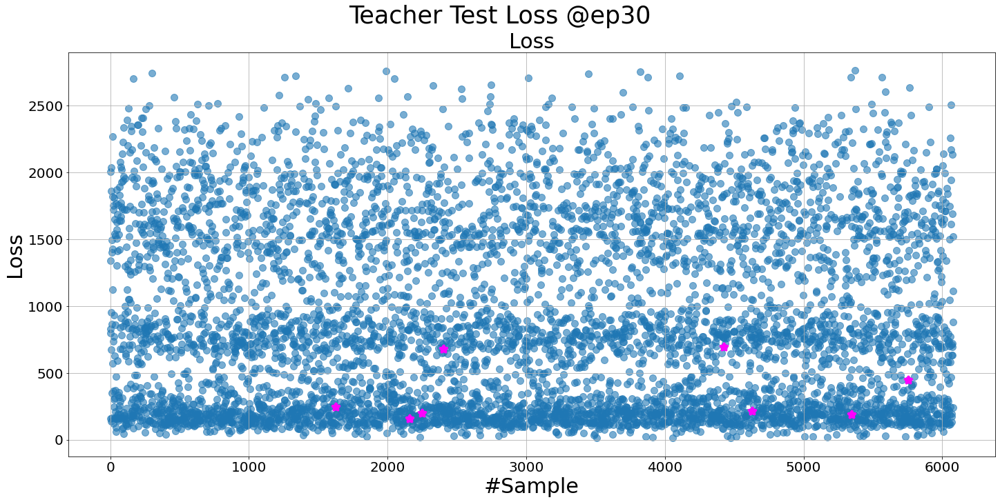

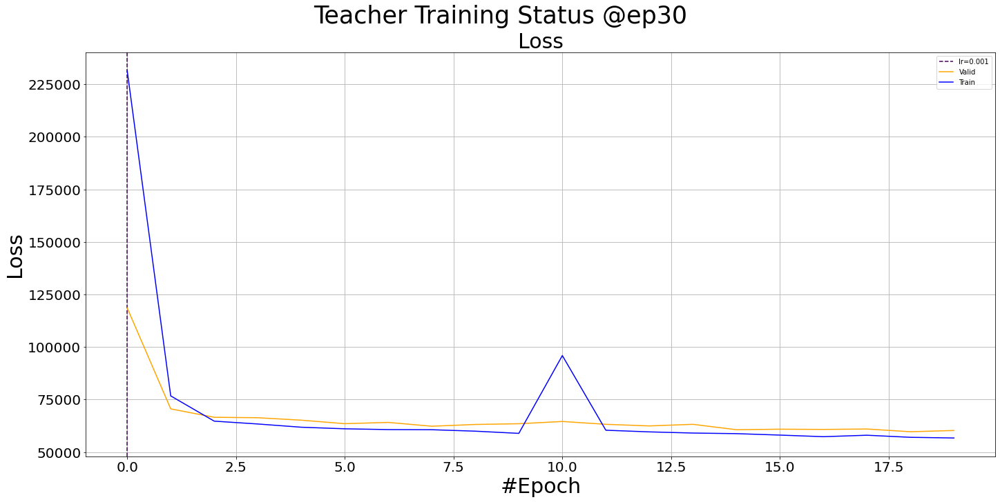

Teacher: epoch=9/10, batch=76/95,loss=49700.73046875
Total training time: 120.34721422195435 sec
Teacher: test=76/95, loss=960.97711181640622
Test finished. Average loss={'LOSS': 849.6687401589594}


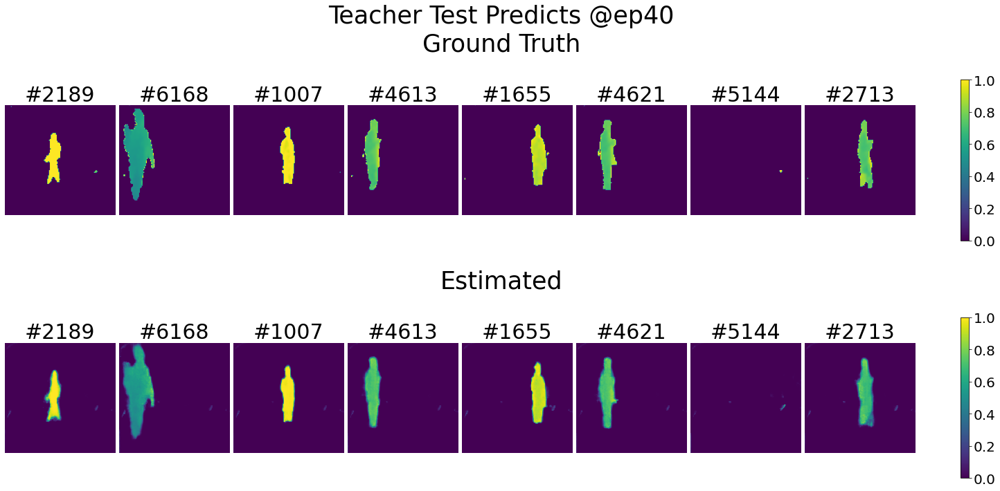

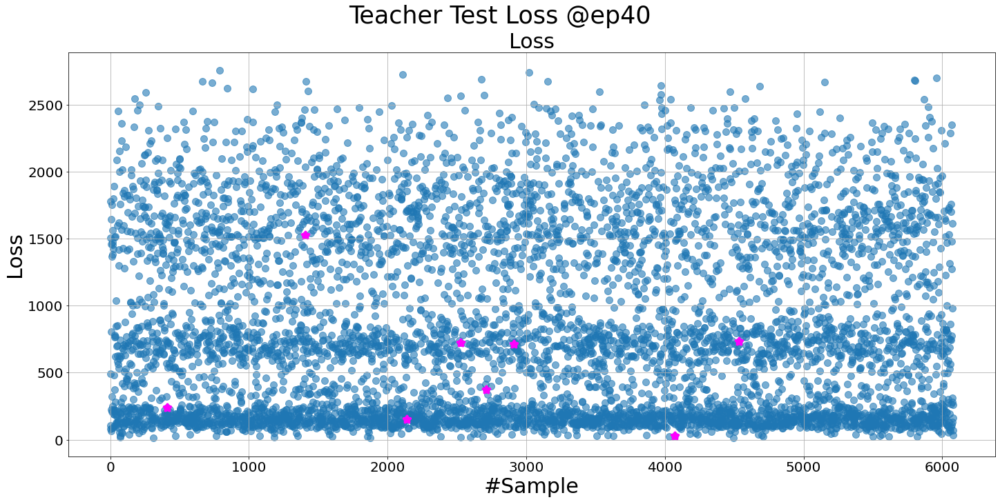

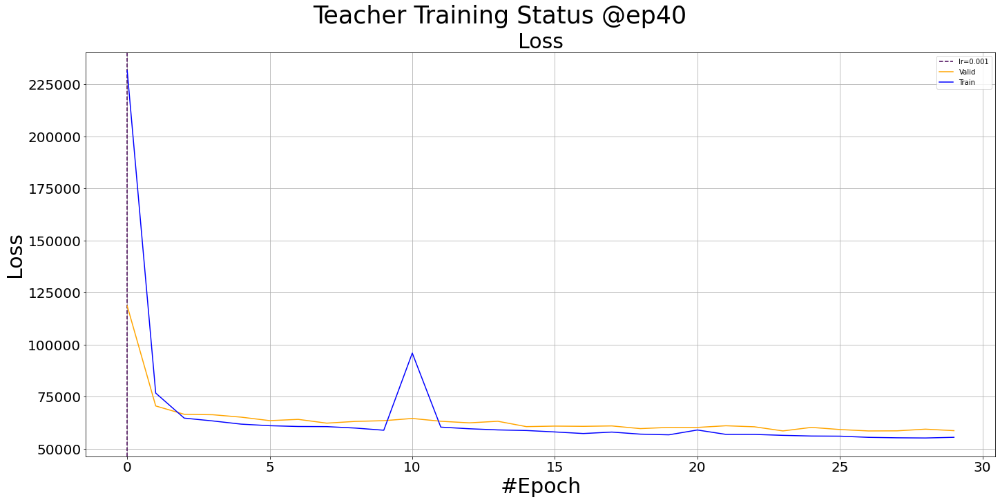

Teacher: epoch=9/10, batch=76/95,loss=62274.84375255
Total training time: 120.36858248710632 sec
Teacher: test=76/95, loss=1876.8431396484375
Test finished. Average loss={'LOSS': 832.223343240901}


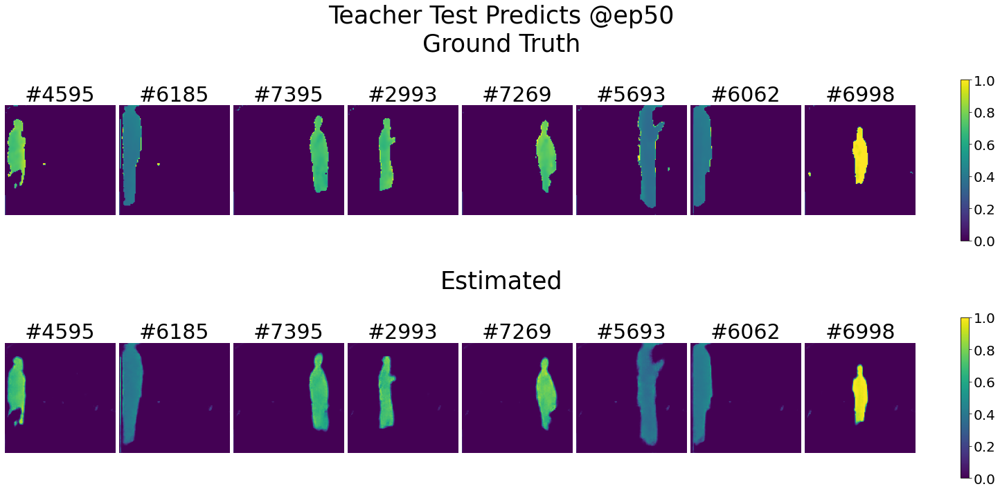

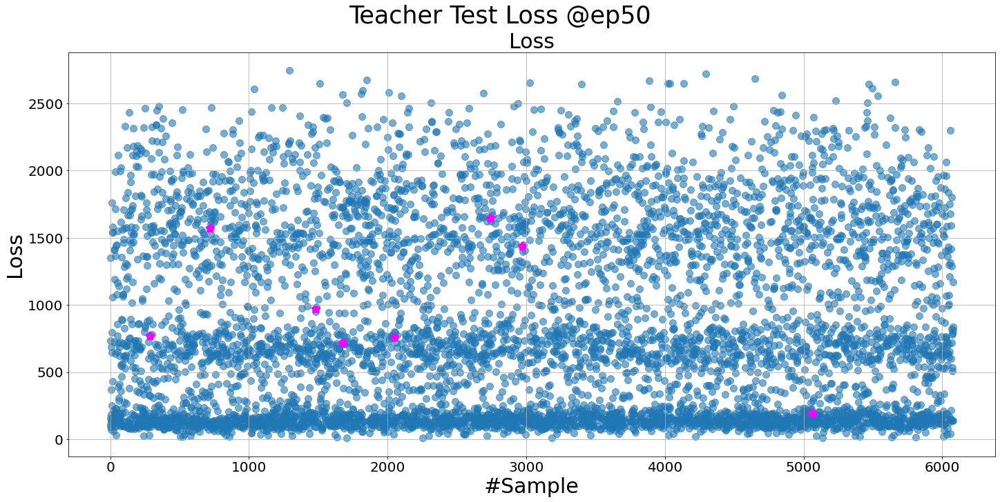

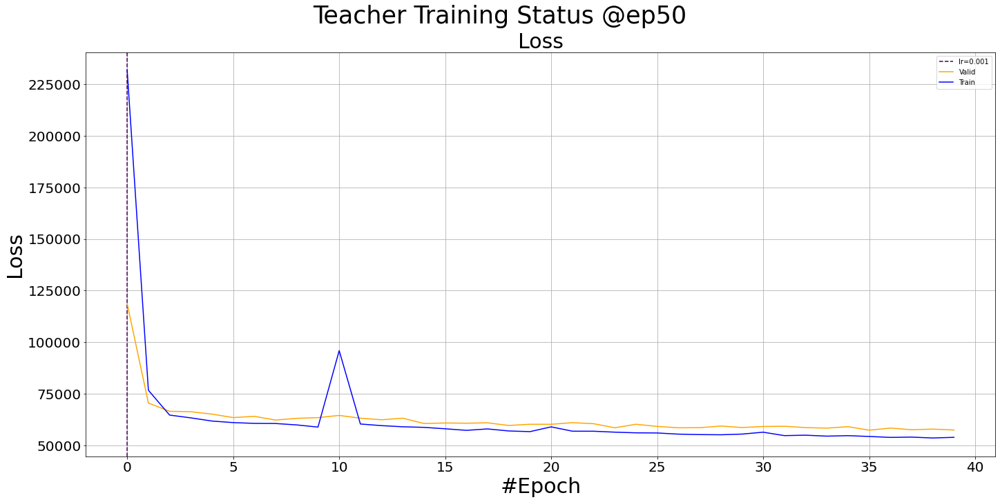

Teacher: epoch=9/10, batch=76/95,loss=53382.48437555
Total training time: 120.42925310134888 sec
Teacher: test=76/95, loss=590.29357910156255
Test finished. Average loss={'LOSS': 822.1936966008261}


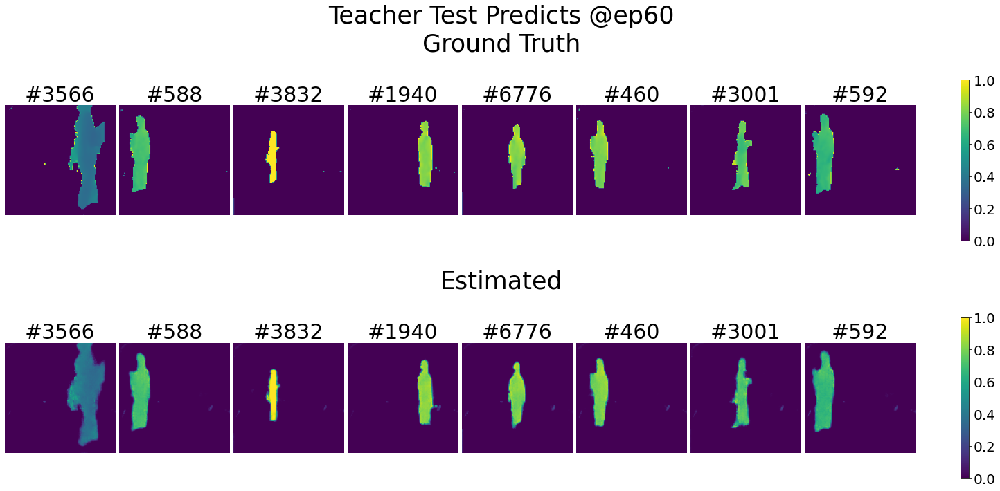

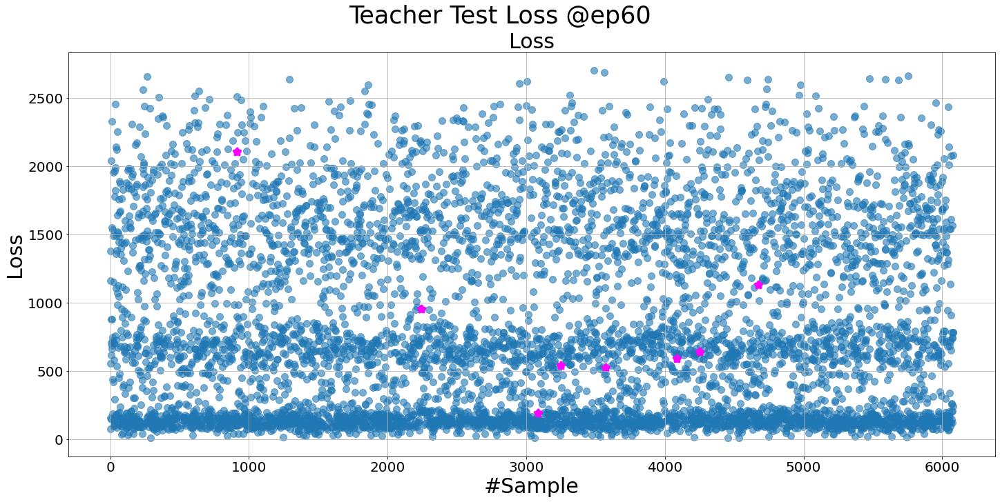

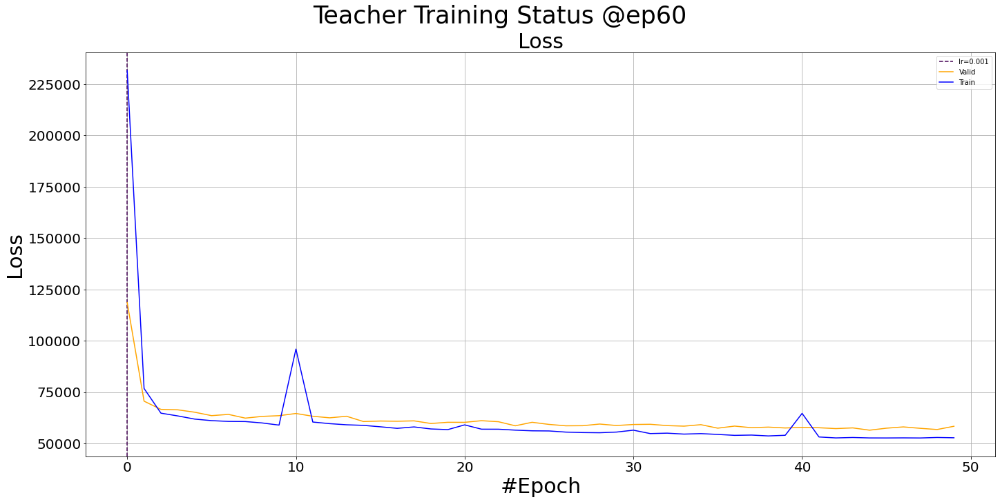

Teacher: epoch=9/10, batch=76/95,loss=56186.36718755
Total training time: 120.35817050933838 sec
Teacher: test=76/95, loss=1277.5686035156252
Test finished. Average loss={'LOSS': 819.5389564085948}


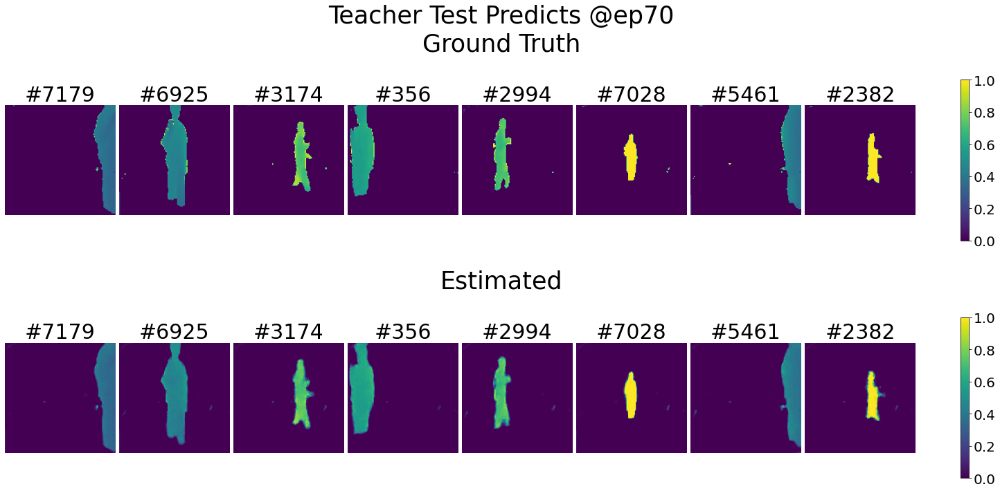

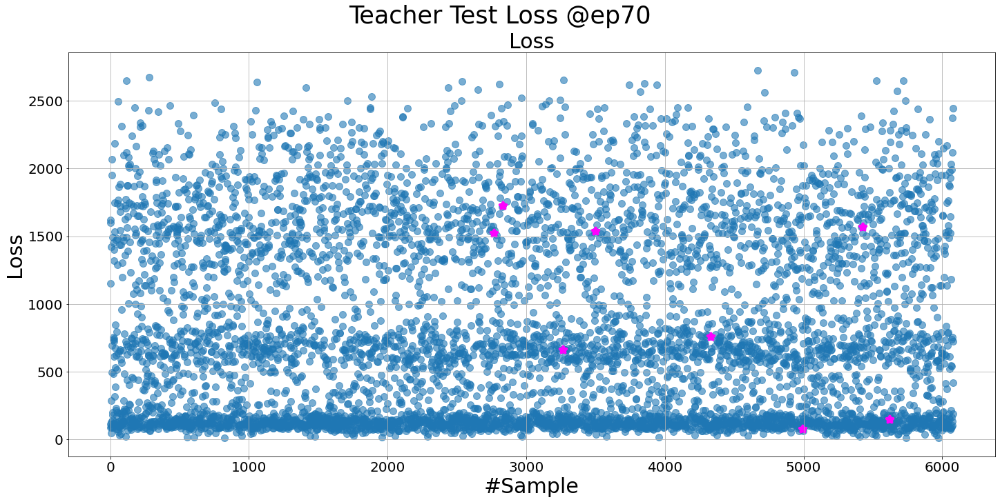

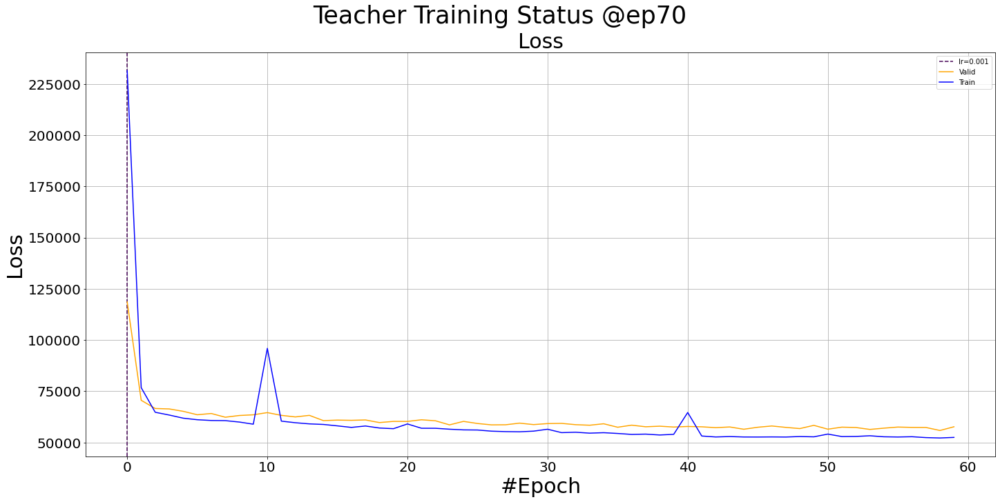

Teacher: epoch=9/10, batch=76/95,loss=50724.12590625
Total training time: 120.4037446975708 sec
Teacher: test=76/95, loss=1726.3094482421875
Test finished. Average loss={'LOSS': 806.5231832766219}


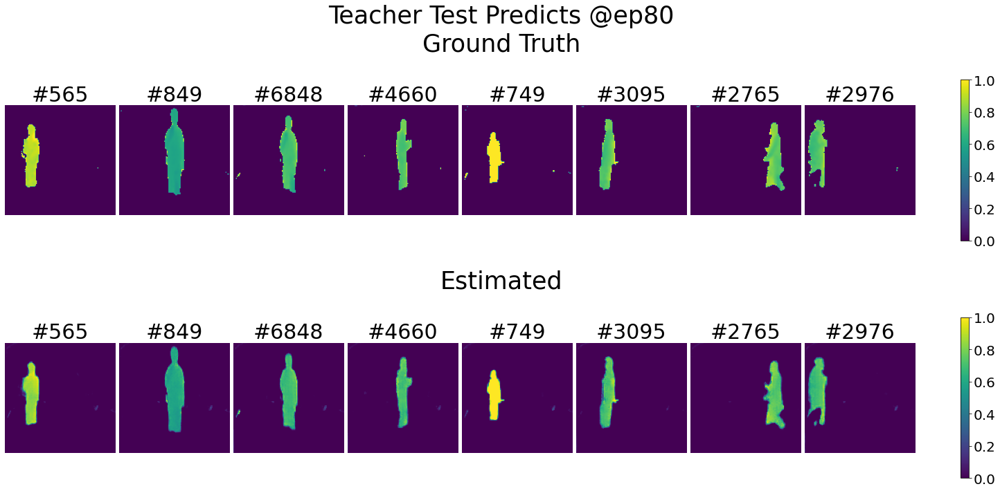

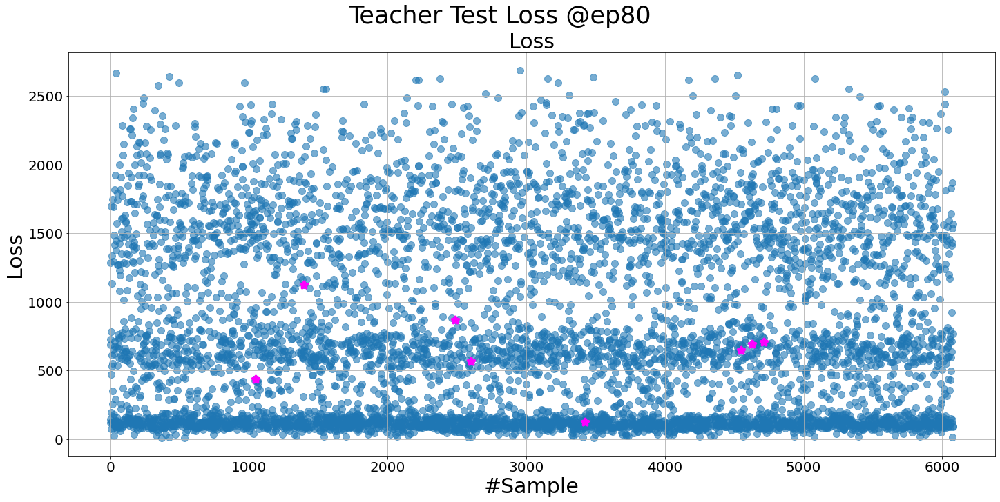

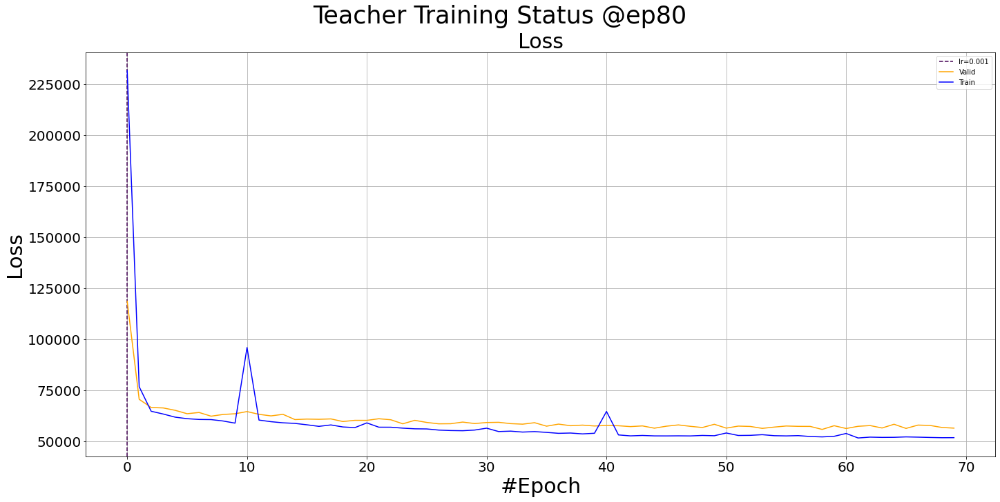

Teacher: epoch=9/10, batch=76/95,loss=52914.91406255
Total training time: 120.30711102485657 sec
Teacher: test=76/95, loss=593.0612792968752
Test finished. Average loss={'LOSS': 793.5396119961613}


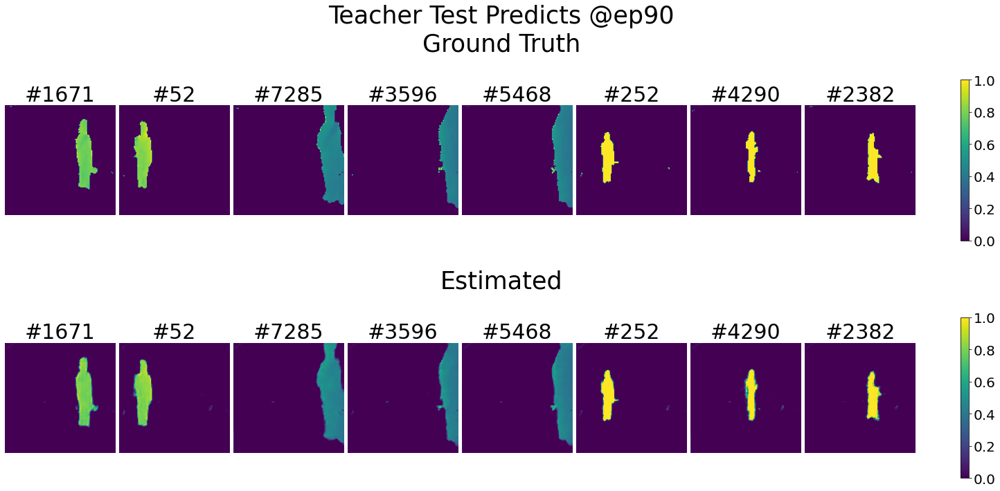

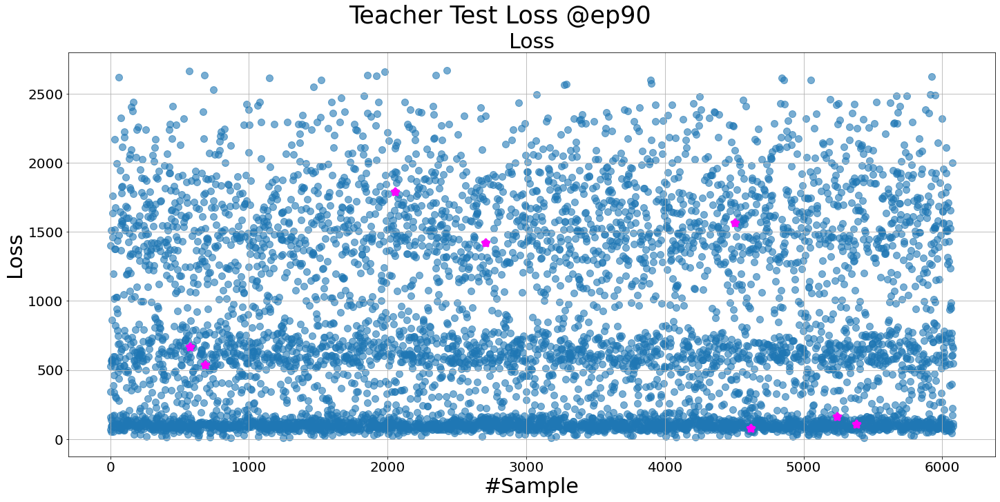

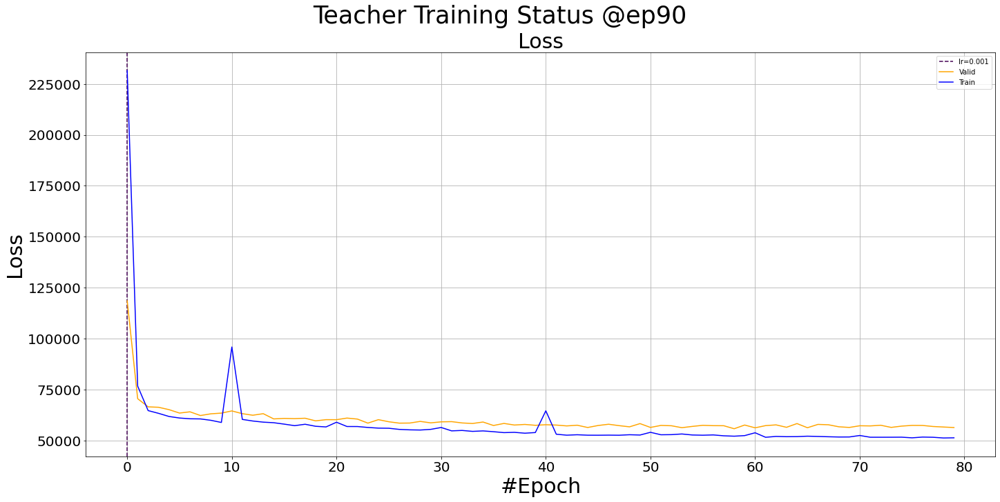

Teacher: epoch=9/10, batch=76/95,loss=44278.32421875
Total training time: 120.31975865364075 sec
Teacher: test=76/95, loss=151.64222717285156
Test finished. Average loss={'LOSS': 839.8703896839368}


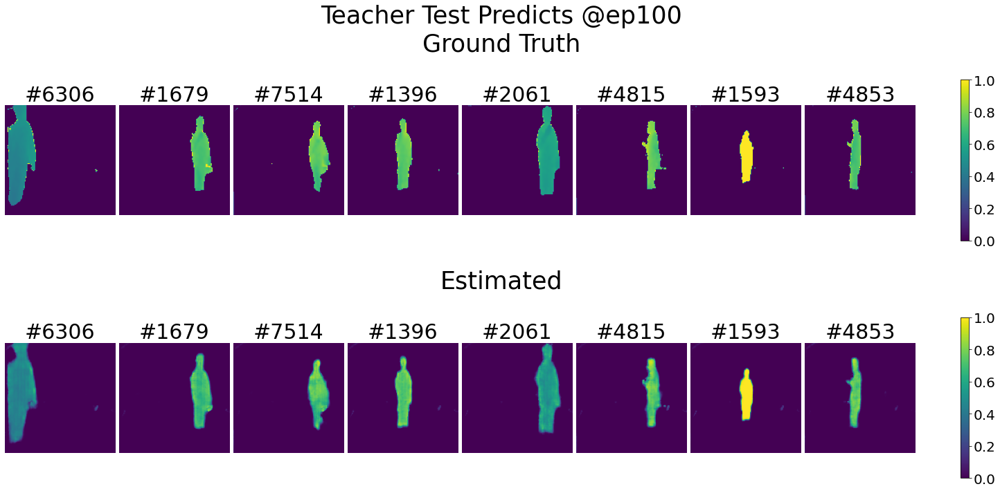

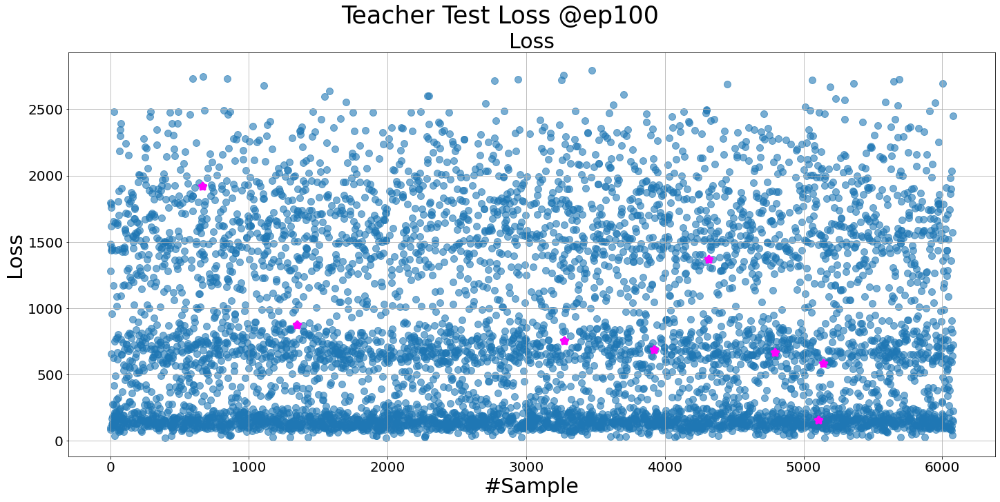

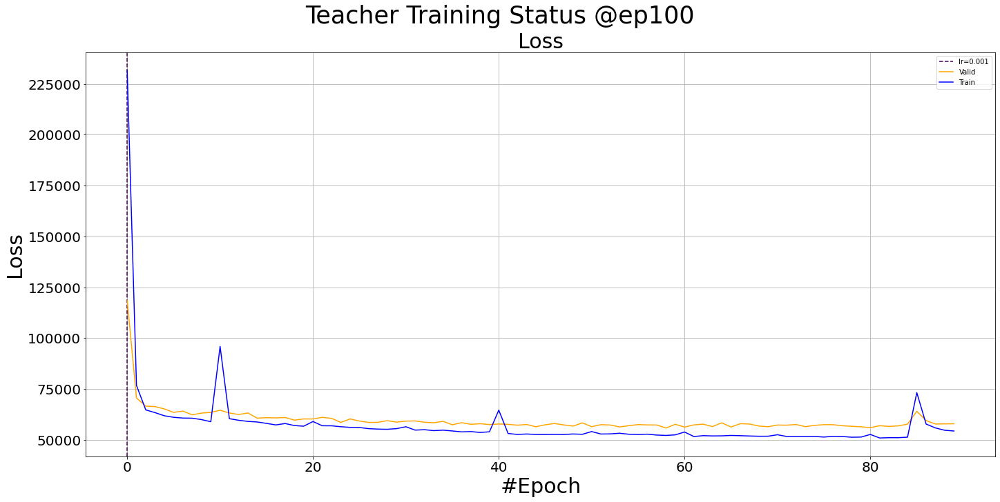

Teacher: epoch=9/10, batch=76/95,loss=43470.72656255
Total training time: 120.03552508354187 sec
Teacher: test=76/95, loss=396.76028442382815
Test finished. Average loss={'LOSS': 809.6242929713507}


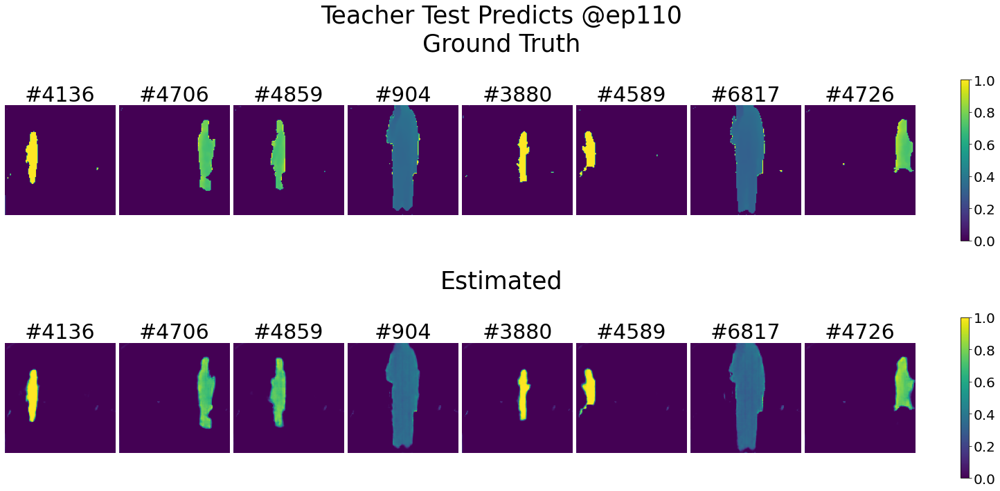

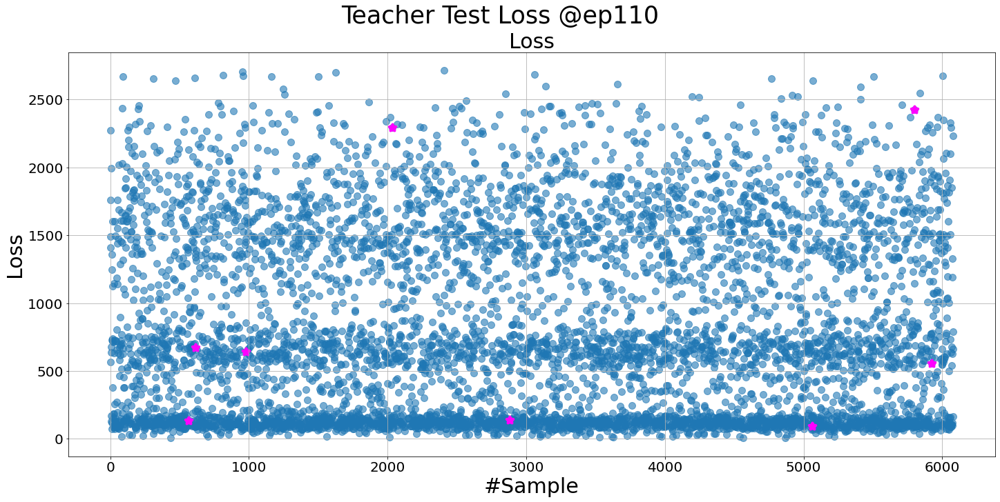

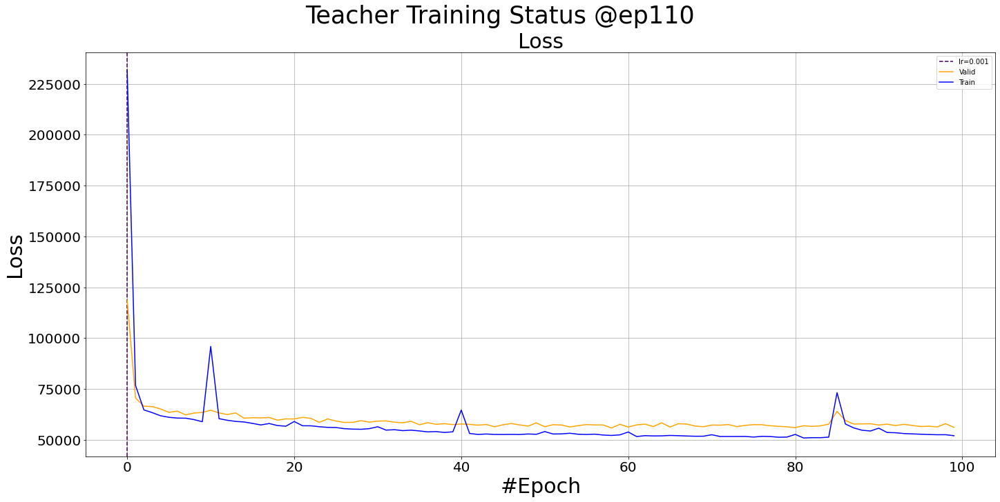

Student: epoch=9/10, batch=76/95,loss=181119.187525
Total training time: 147.06555795669556 sec
Student: test=76/95, loss=2104.101074218755
Test finished. Average loss={'LOSS': 2841.9813762363633, 'STRA': 9459.351505078768, 'DIST': 5.965454349384986, 'IMG': 0.024520361031816144}


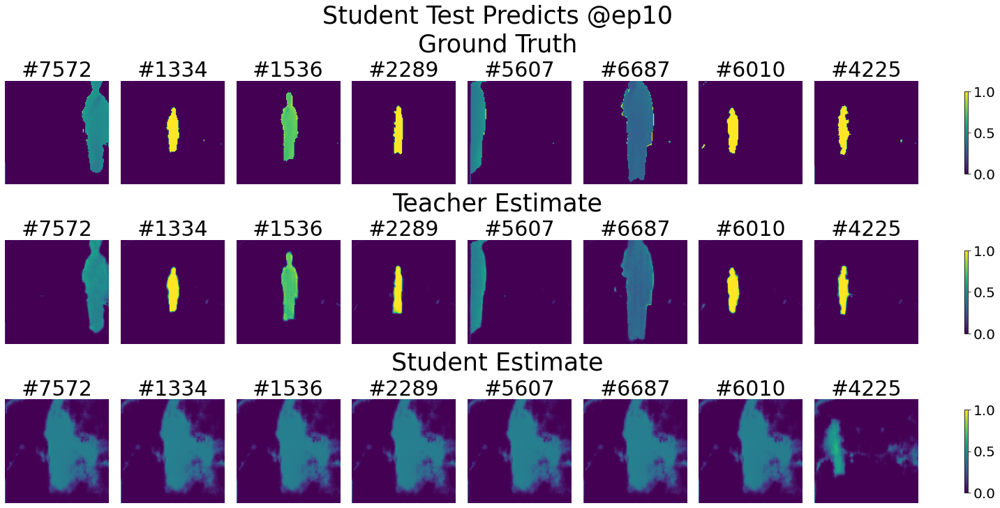

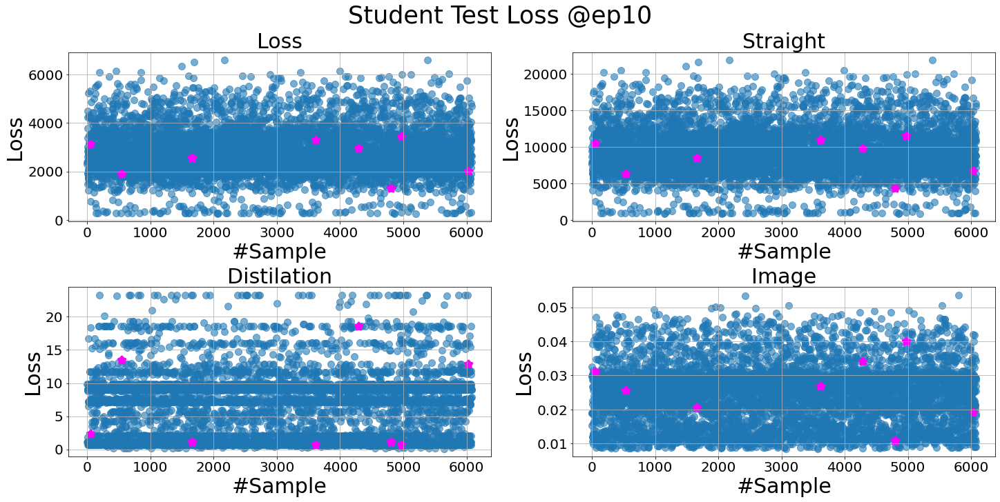

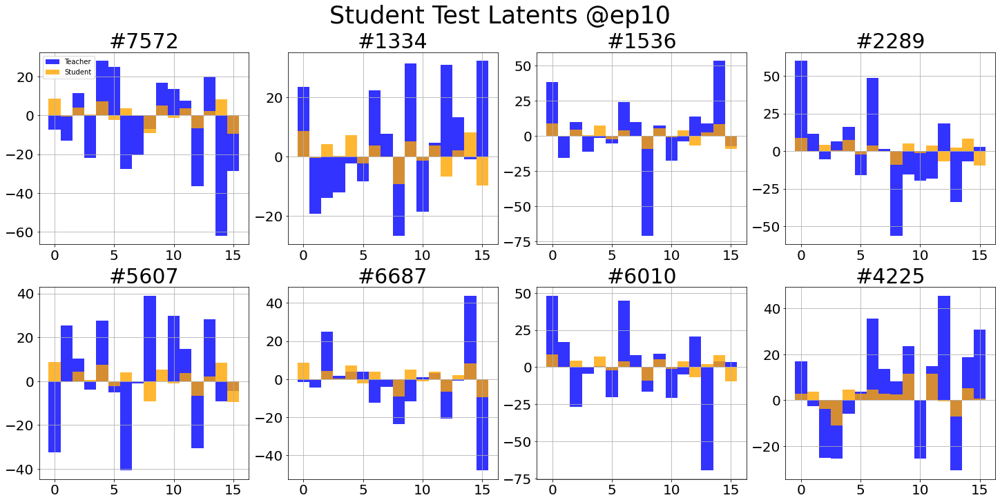

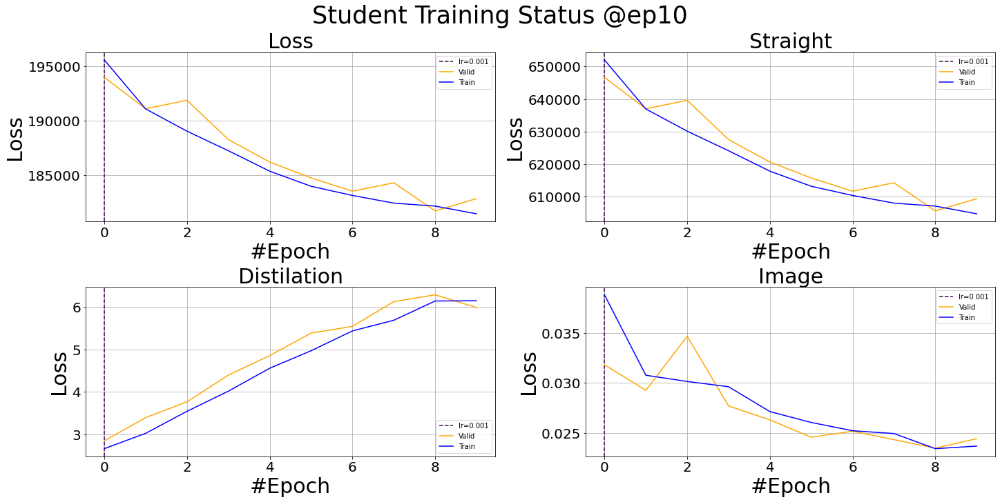

Student: epoch=9/10, batch=76/95,loss=173878.640625
Total training time: 146.13549637794495 sec
Student: test=76/95, loss=2858.2602539062575
Test finished. Average loss={'LOSS': 2789.499640956678, 'STRA': 9283.321854782105, 'DIST': 6.432811620207069, 'IMG': 0.0238939963236733}


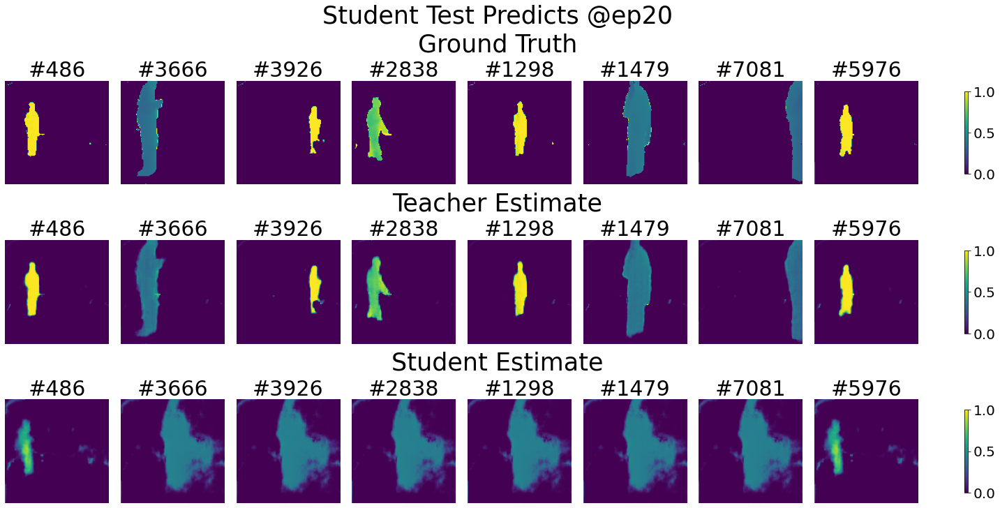

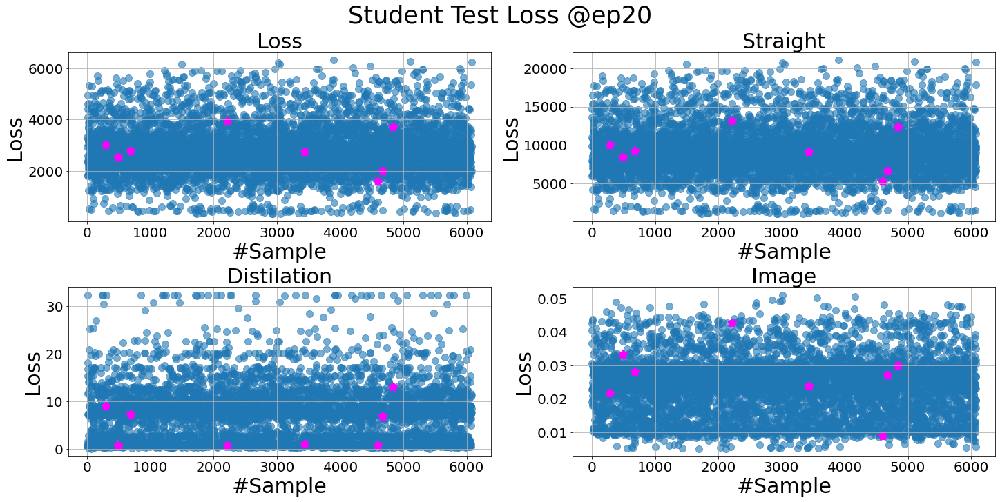

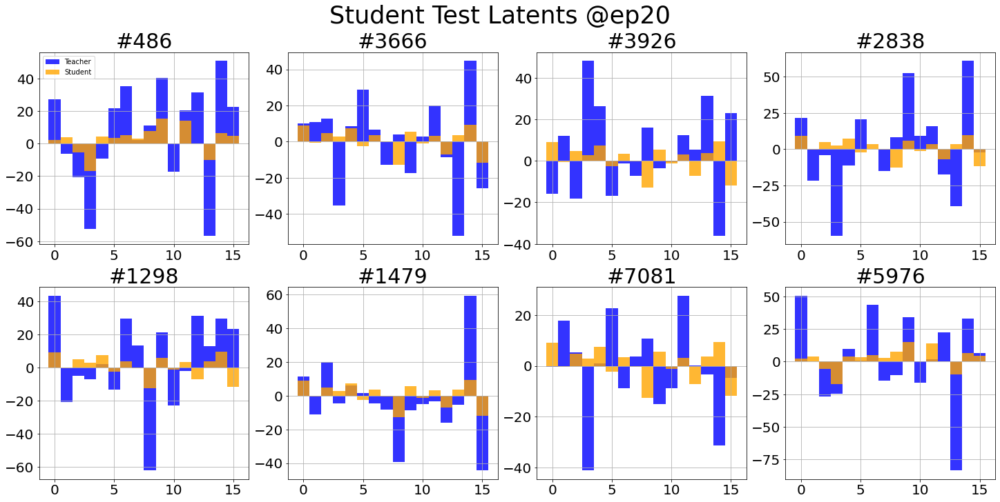

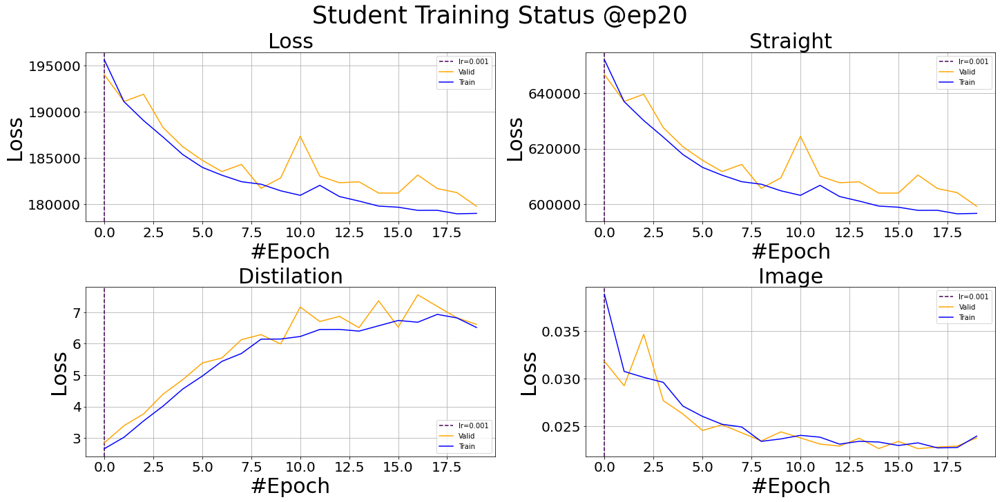

Student: epoch=9/10, batch=76/95,loss=176516.078125
Total training time: 145.9840853214264 sec
Student: test=76/95, loss=2525.016845703125
Test finished. Average loss={'LOSS': 2794.5418006947166, 'STRA': 9300.023200326217, 'DIST': 6.478191724980455, 'IMG': 0.02370600718660219}


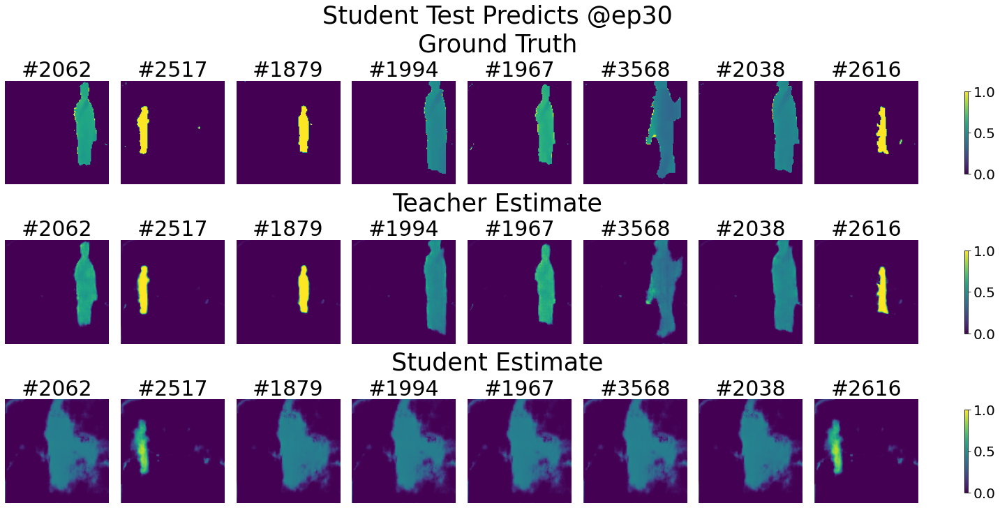

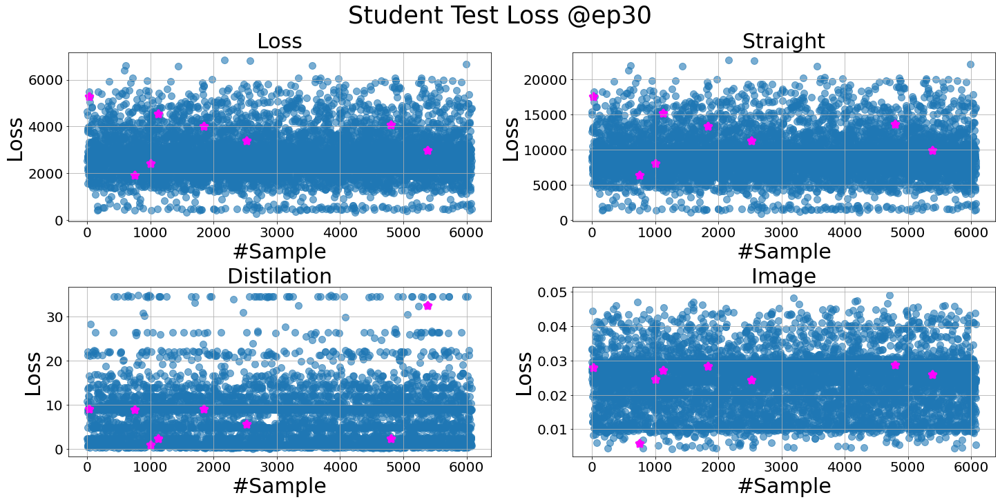

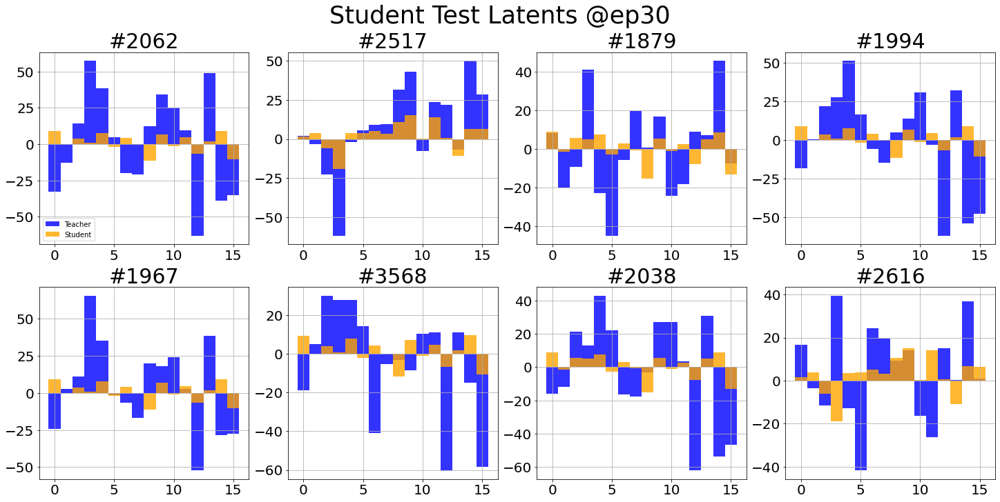

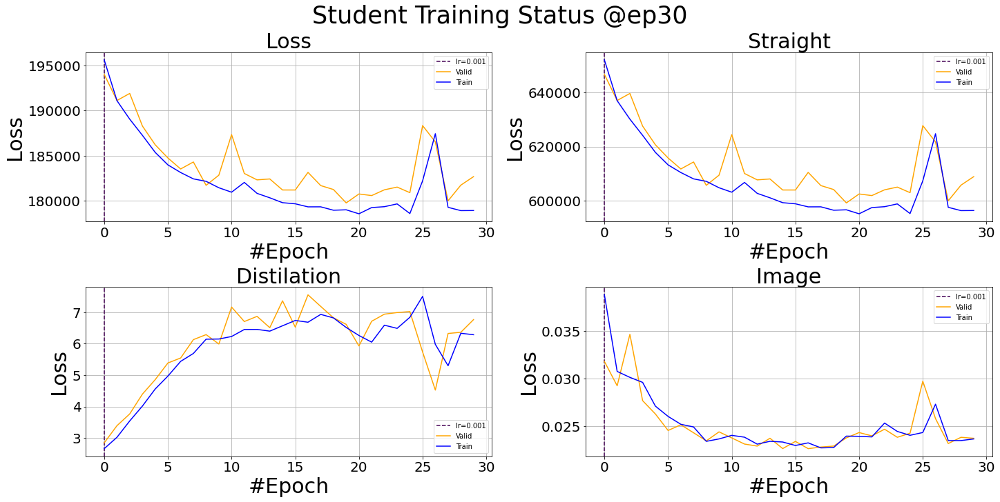

Student: epoch=9/10, batch=76/95,loss=183642.062575
Total training time: 146.14034342765808 sec
Student: test=76/95, loss=2573.718756953125
Test finished. Average loss={'LOSS': 2807.0916351569326, 'STRA': 9345.074851417541, 'DIST': 5.098662943983647, 'IMG': 0.023899260988936907}


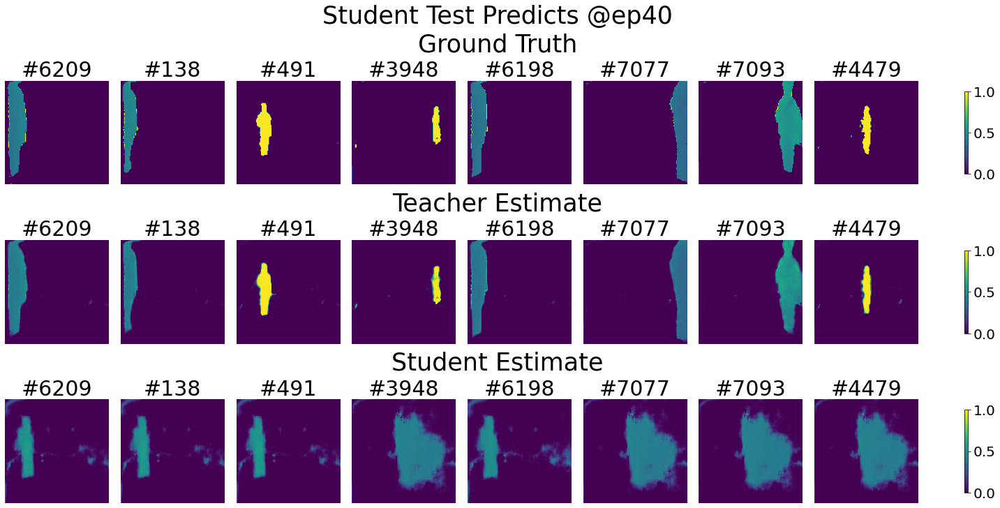

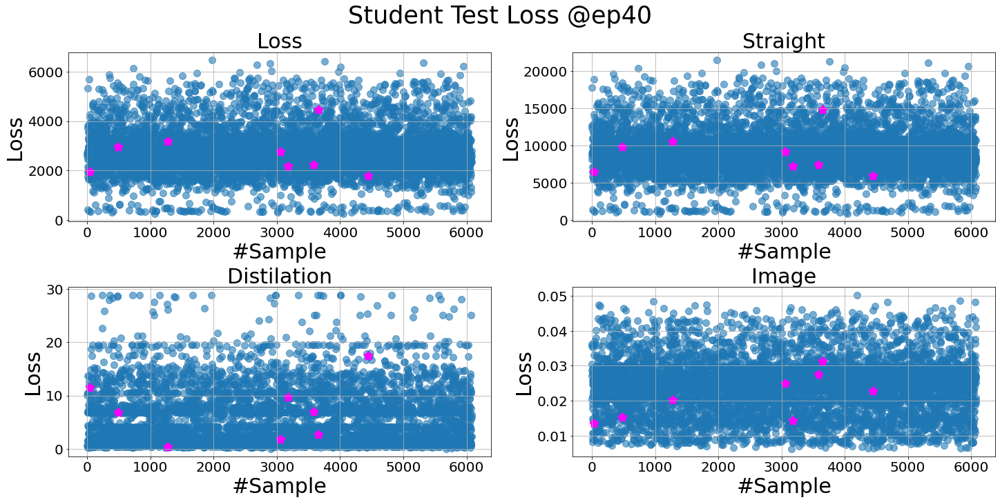

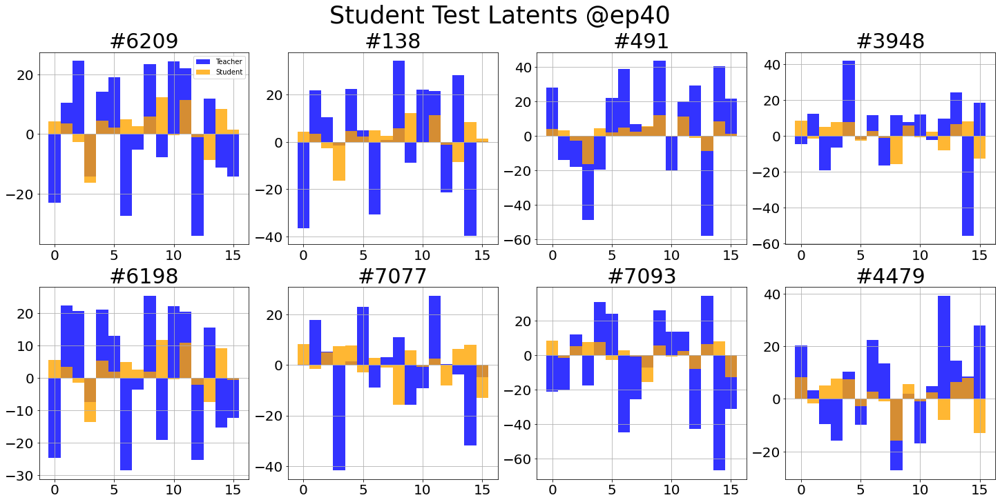

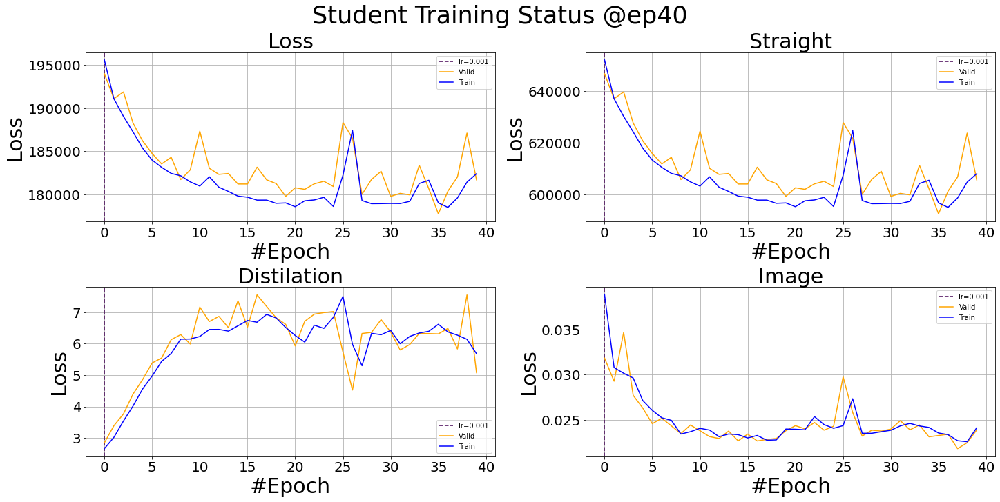

Student: epoch=9/10, batch=76/95,loss=183829.096875
Total training time: 145.08490180969238 sec
Student: test=76/95, loss=2728.111572265625
Test finished. Average loss={'LOSS': 2824.413021609658, 'STRA': 9397.685487807425, 'DIST': 7.296079988401739, 'IMG': 0.022749680187859524}


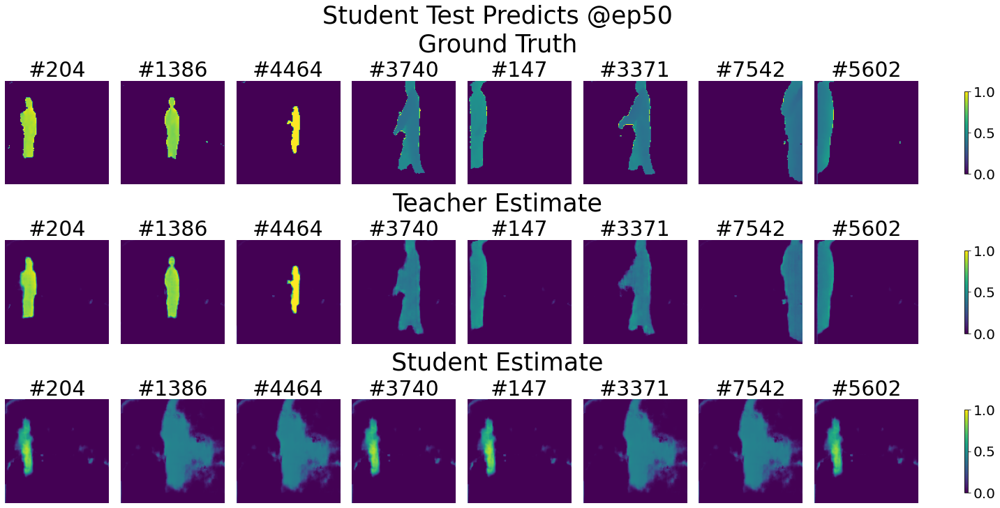

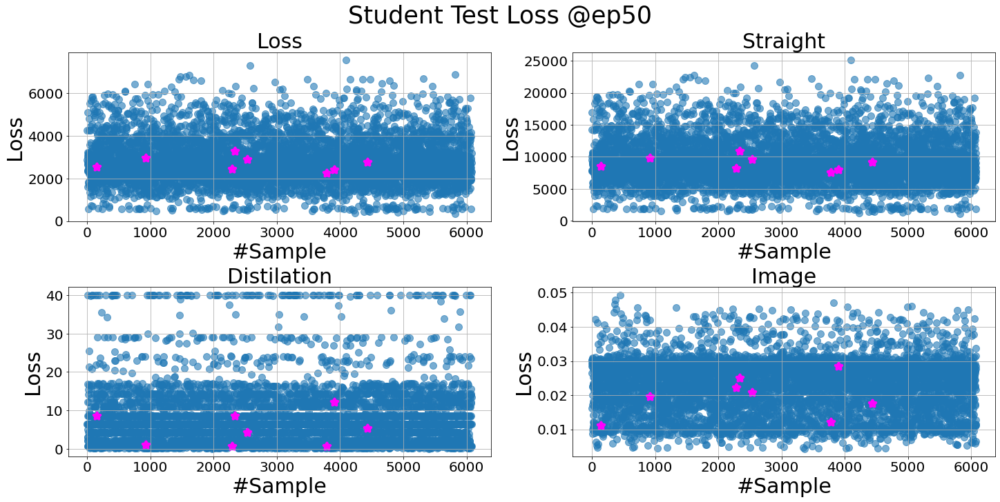

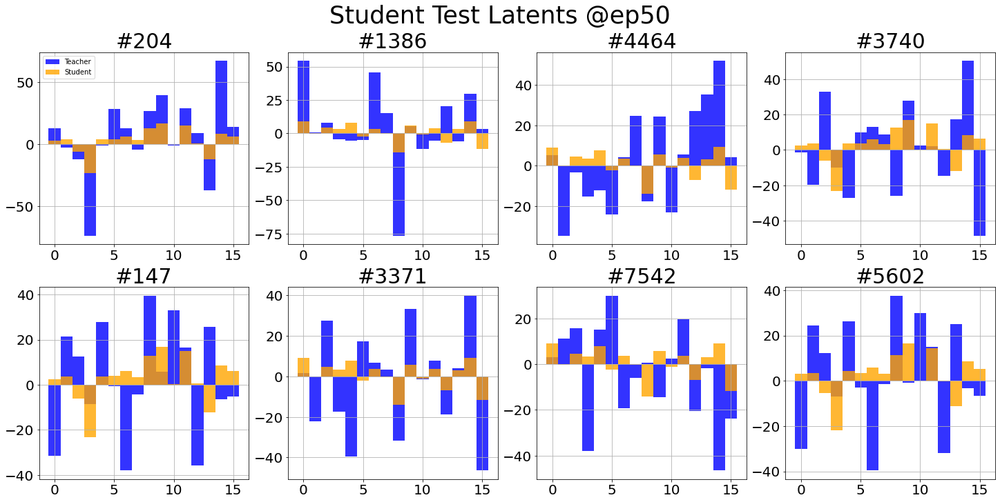

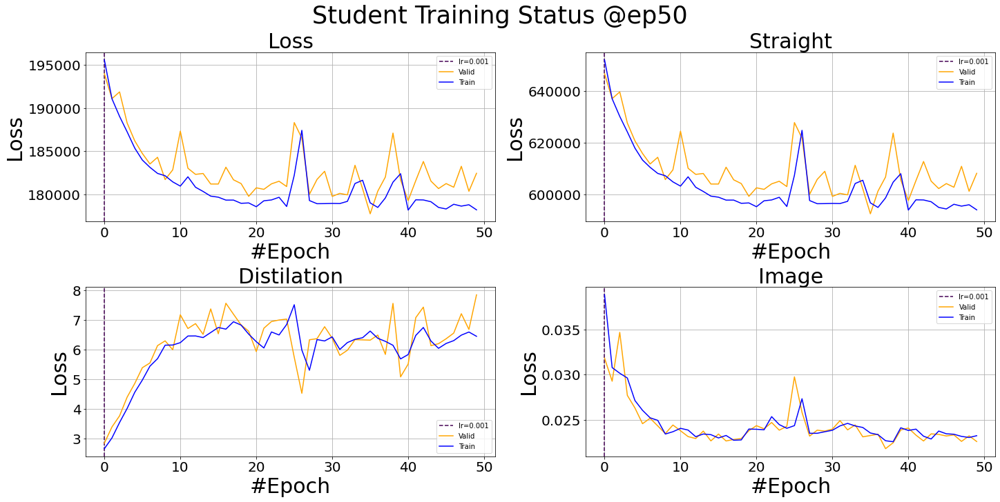

Student: epoch=9/10, batch=76/95,loss=187734.406255
Total training time: 145.87800478935242 sec
Student: test=76/95, loss=2415.116699218755
Test finished. Average loss={'LOSS': 2874.128483732123, 'STRA': 9564.640013283177, 'DIST': 6.766229161335842, 'IMG': 0.022036050504539162}


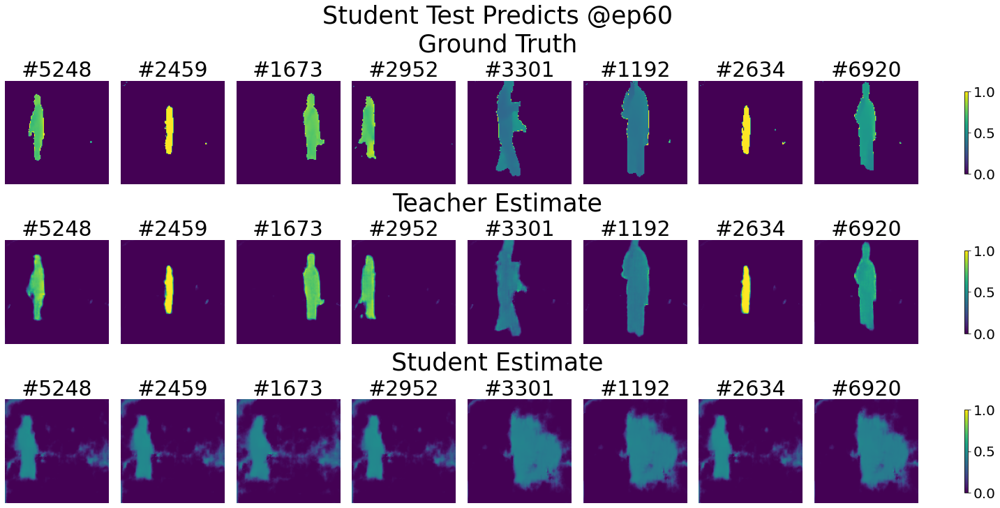

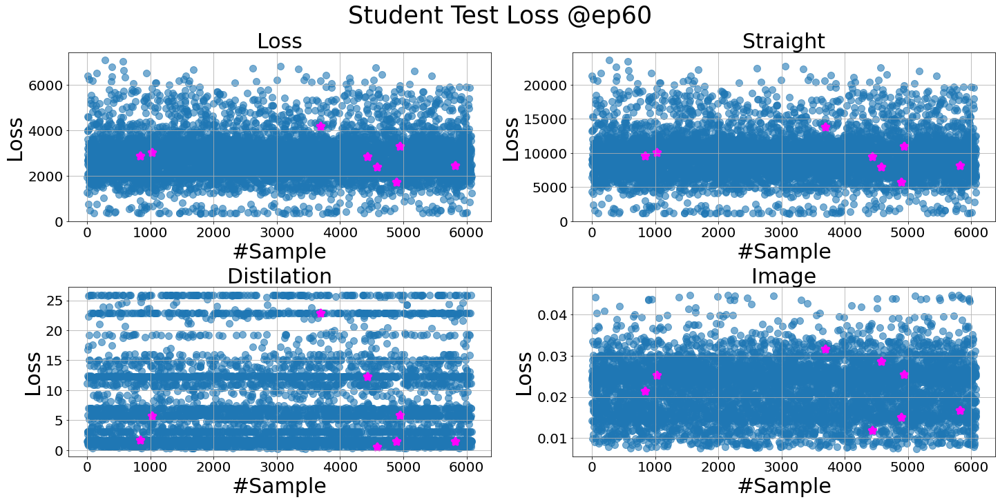

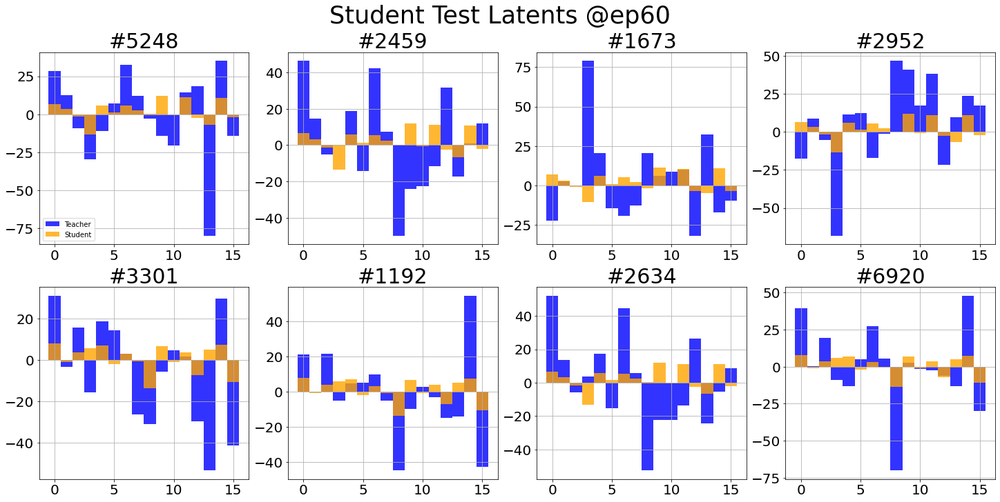

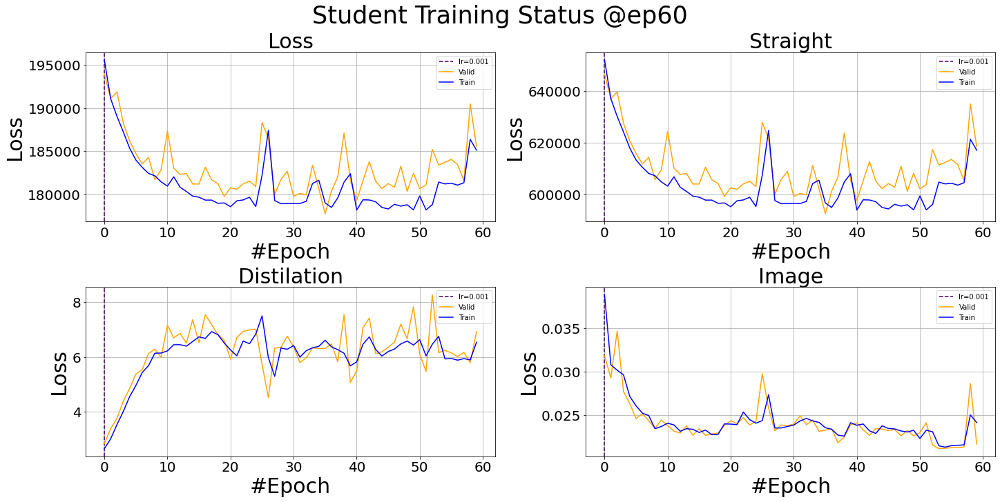

Student: epoch=9/10, batch=76/95,loss=192115.140625
Total training time: 145.67419958114624 sec
Student: test=76/95, loss=3021.449707031255
Test finished. Average loss={'LOSS': 2827.8401989434897, 'STRA': 9412.717469125046, 'DIST': 5.749786035168769, 'IMG': 0.021790696804390264}


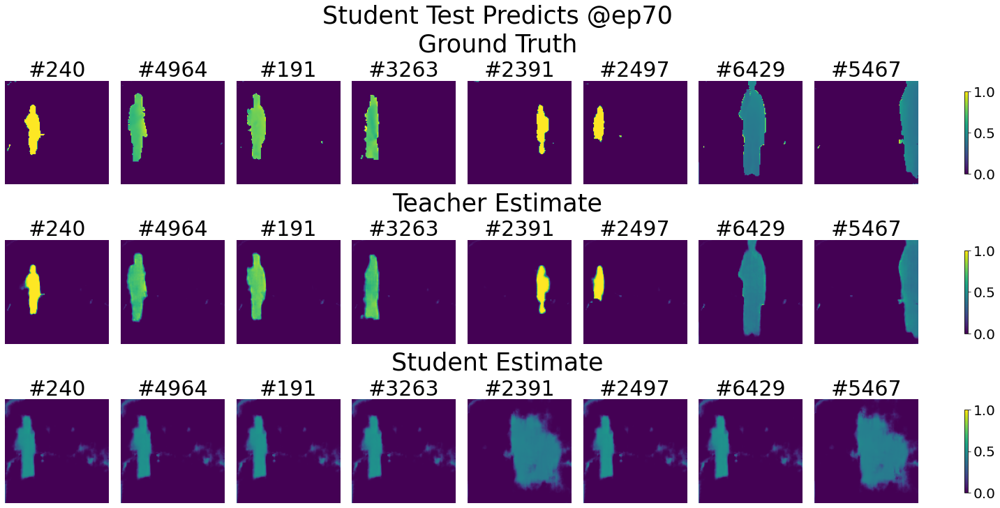

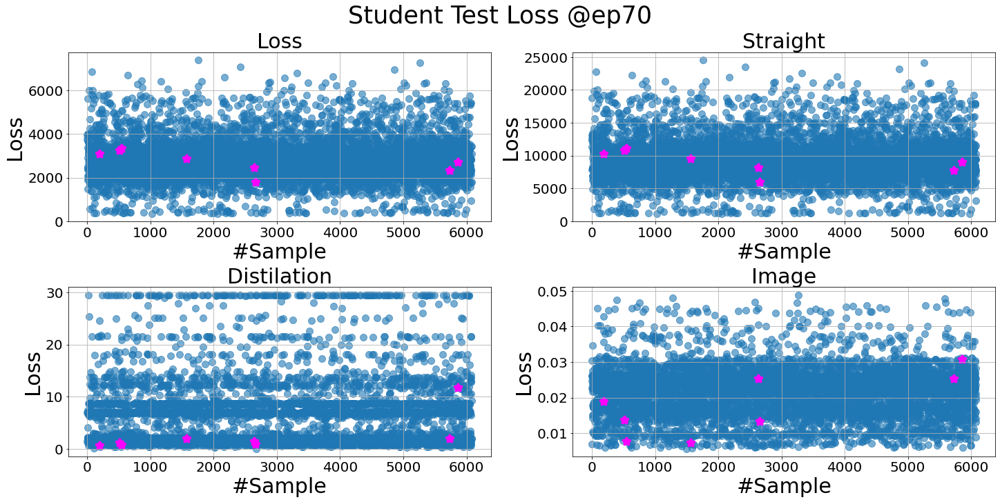

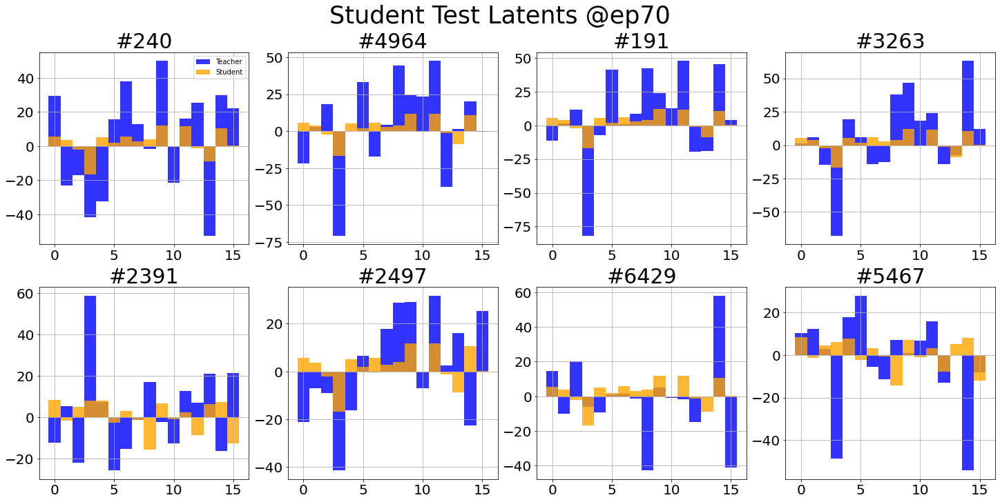

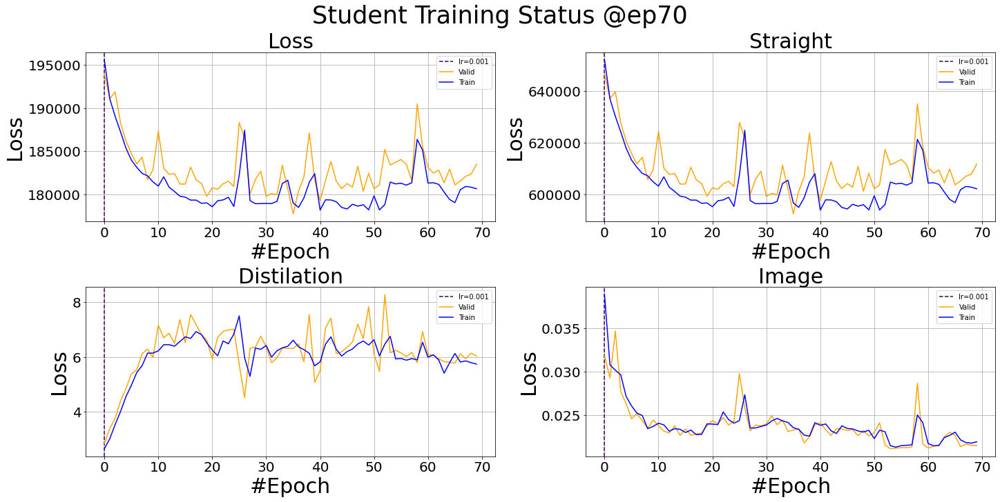

Student: epoch=9/10, batch=76/95,loss=183572.875375
Total training time: 145.8321671485901 sec
Student: test=76/95, loss=4476.6010742187575
Test finished. Average loss={'LOSS': 2831.404544584375, 'STRA': 9424.546384731091, 'DIST': 5.772160798845518, 'IMG': 0.0222778156231231}


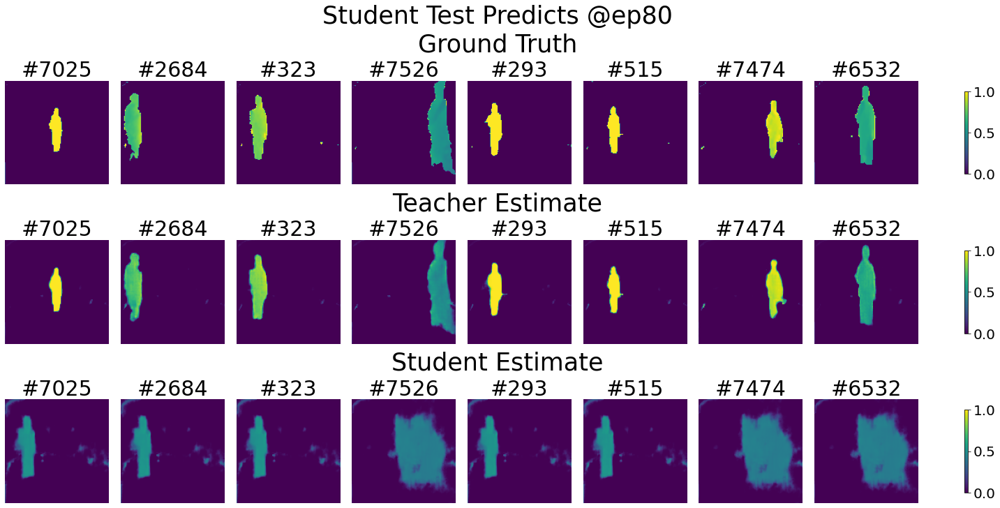

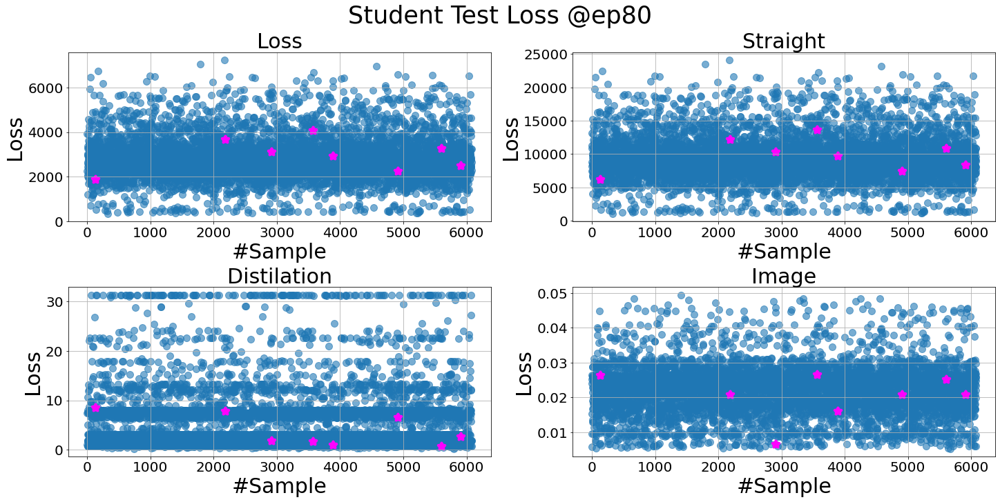

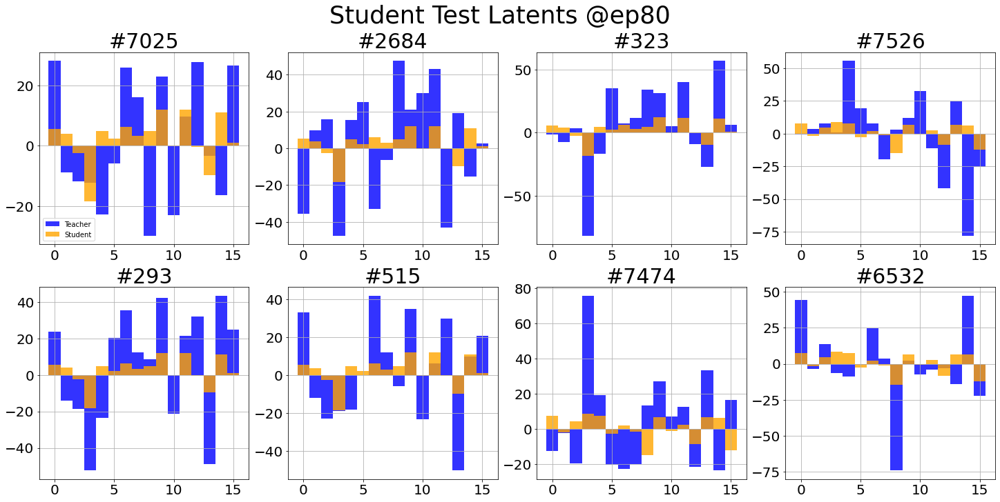

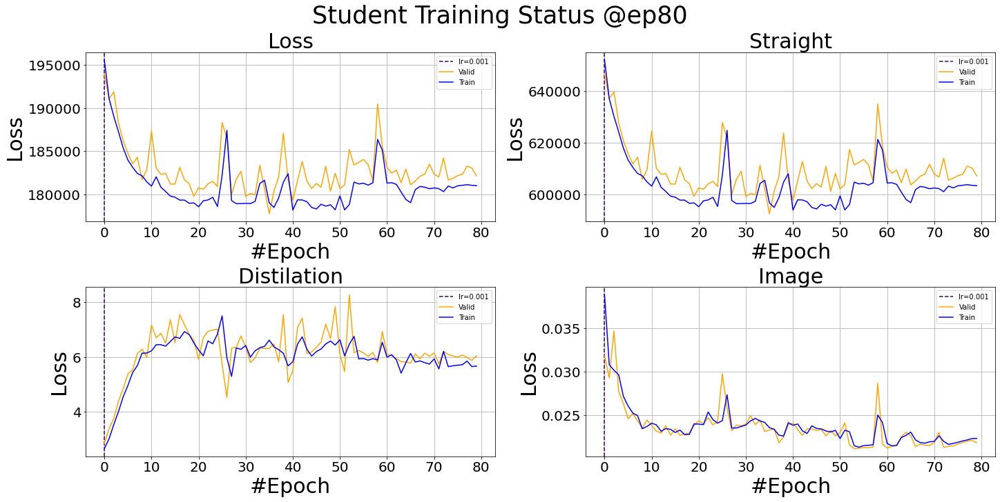

Student: epoch=9/10, batch=76/95,loss=176398.968755
Total training time: 145.8419530391693 sec
Student: test=76/95, loss=2386.100097656255
Test finished. Average loss={'LOSS': 2832.1862447989615, 'STRA': 9425.721211423372, 'DIST': 6.385378962082445, 'IMG': 0.021647428457110533}


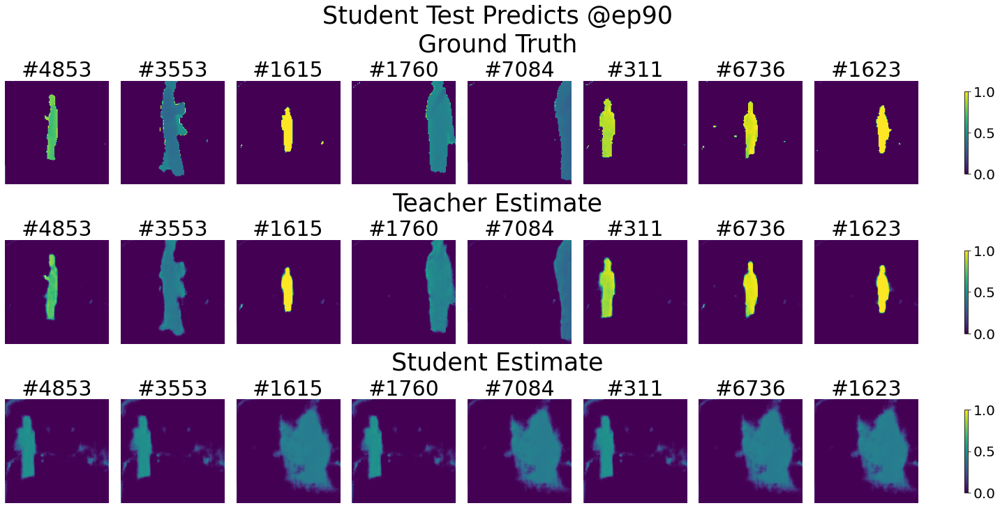

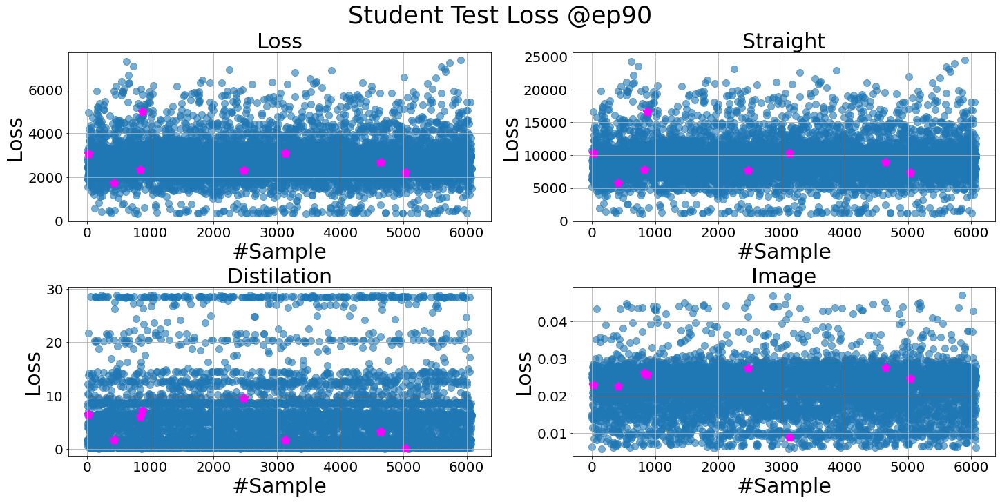

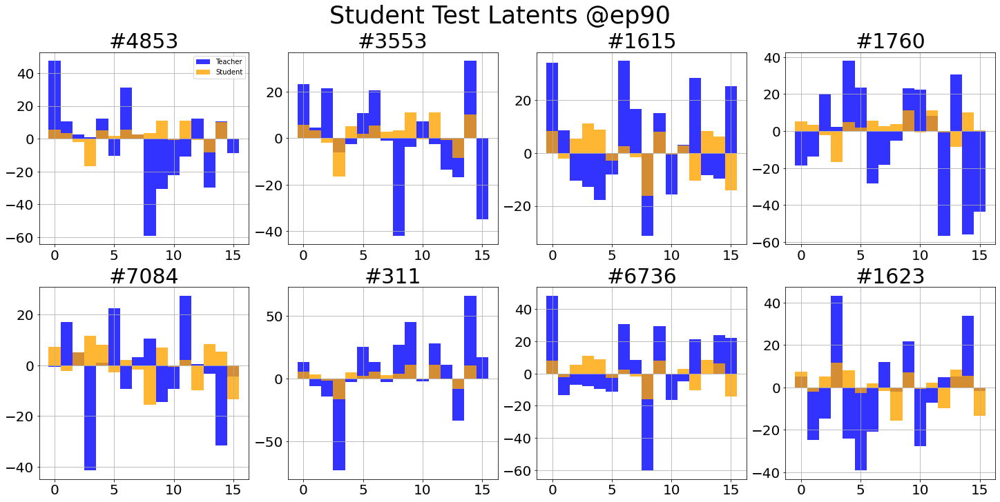

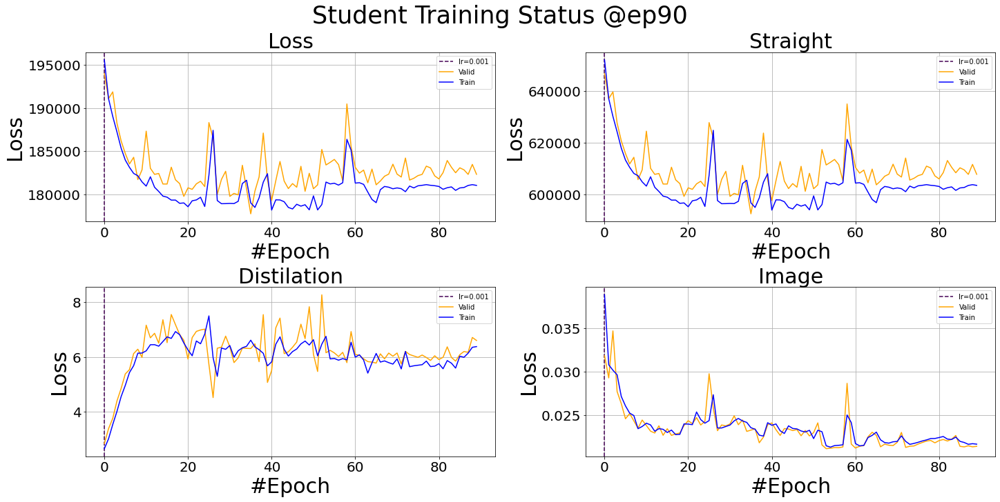

Student: epoch=9/10, batch=76/95,loss=180172.156255
Total training time: 146.26080107688904 sec
Student: test=76/95, loss=482.65087890625255
Test finished. Average loss={'LOSS': 2820.89496838921, 'STRA': 9388.967329647667, 'DIST': 6.006666327031378, 'IMG': 0.021811084375689172}


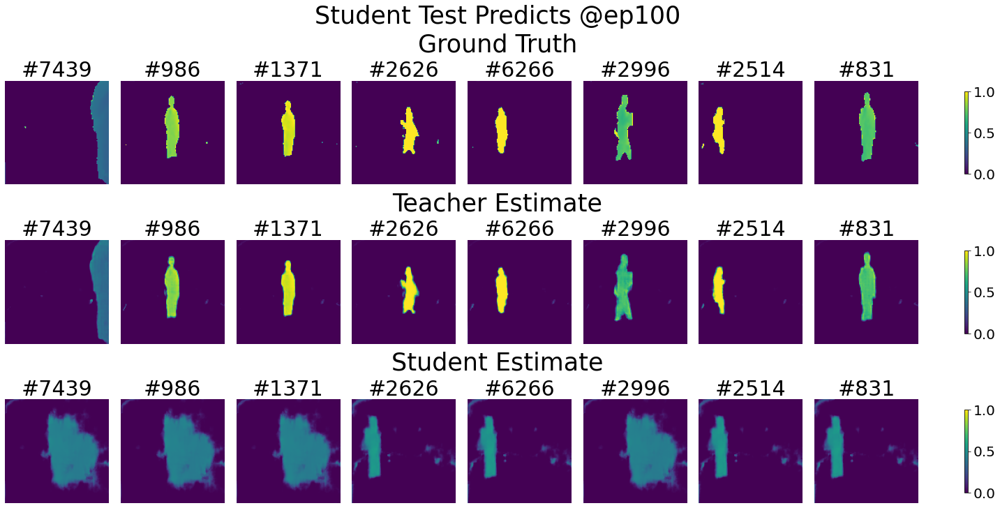

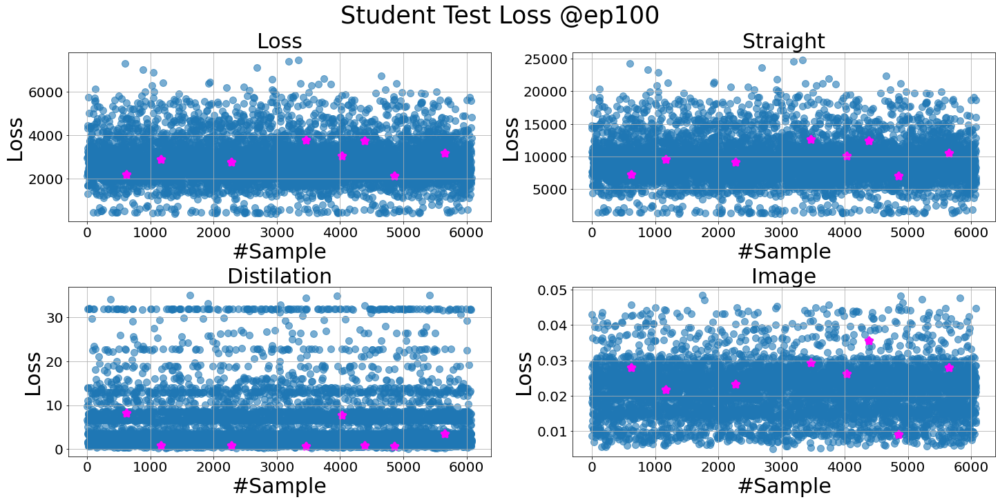

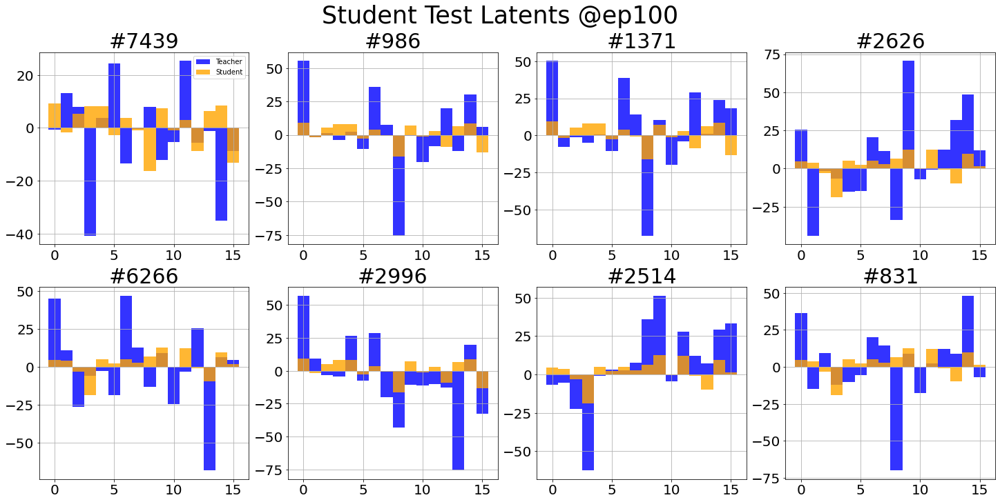

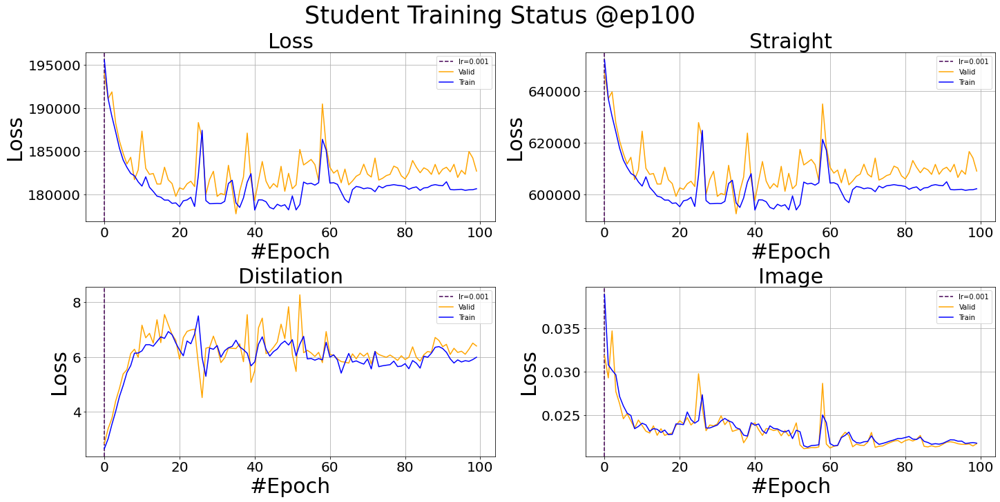


Schedule Completed!


In [9]:
# Scheduler
%matplotlib inline
trainer.scheduler(train_t=True, lr_decay=False, autosave=True, notion='0828r3')

In [ ]:
# Plot loss curves
%matplotlib inline
trainer.plot_teacher_loss()

In [ ]:
  #=====================test============================
trainer.test_teacher(mode='test')

In [ ]:
%matplotlib inline
trainer.plot_teacher_test()

In [ ]:
# Training and Saving
trainer.train_student()

In [ ]:
# Plot loss curves
%matplotlib inline
trainer.plot_student_loss()

In [ ]:
  #=====================test============================
trainer.test_student()

In [ ]:
# Final outputs
%matplotlib inline
trainer.plot_student_test()

In [ ]:
trainer.save_all_params(notion='0828r3')

In [15]:
print(len(trainer.test_loss['s']['S_LATENT']))

6080
